# CASE STUDY - "Predicting purchase likelihood based on user browsing behavior in online shopping websites."

# Problem statement:

People often spend a lot of time browsing through online shopping websites, but the conversion rate into purchases is low. Determine the likelihood of purchase based on the given features in the dataset. The dataset consists of feature vectors belonging to 12,330 online sessions. 

### Data Description:

The dataset contains the following features:


1. **Administrative** -	Number of pages visited by the user for user account management related activities	Discrete values from 0 to 27 
2. **Administrative_Duration** -	Time spent on Admin pages by the user	Continuous value (time in seconds)
3. **Informational** -	Number of pages visited by the user about the website	Discrete values from 0 to 24
4. **Informational_Duration** -	Time spent on Informational pages by the user	Continuous value (time in seconds)
5. **ProductRelated** -	Number of product related pages visited by the user 	Discrete values from 0 to 705
6. **ProductRelated_Duration** -	Time spent on Product related pages by the user	Continuous value (time in seconds)
7. **BounceRates** -	Average bounce rate of the pages visited by the user	Continuous value 
8. **ExitRates** -	Average exit rate of the pages visited by the user	Continuous value 
9. **PageValues** -	Average page value of the pages visited by the user	Continuous value 
10. **SpecialDay** -	Closeness of the visiting day to a special event like Mother’s Day or festivals like Christmas	Discrete values (0, 0.2, 0.4, 0.6, 0.8, 1.0)
11. **Month** -Month of the visit from Jan to Dec	Categorical
12. **OperatingSystems** -	OperatingSystems of the visitor like windows etc..	Discrete values from 0 to 7
13. **Browser** -	Browser of the visitor like chrome, yahoo etc..	Discrete values from 0 to 12
14. **Region**-	Geographic region from which the session has been started by the visitor	Discrete values from 0 to 8
15. **TrafficType** -	Traffic source through which user has entered the website	Discrete values from 0 to 19
16. **VisitorType** -	Visitor type as New visitor, Returning user or Others	Categorical
17. **Weekend** -	If the user visited on a weekend or not	Boolean
18. **Purchase** -	If the user Purchased / Not	Boolean




# Import the libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

from warnings import filterwarnings
filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler , PowerTransformer

import scipy.stats as stats

import statsmodels.api as sm

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression

from sklearn.naive_bayes import GaussianNB

from sklearn.svm import SVC

from sklearn import tree

from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score,roc_auc_score,roc_curve,f1_score,precision_score,recall_score,classification_report

from sklearn.metrics import cohen_kappa_score,confusion_matrix

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,StackingClassifier

from xgboost import XGBClassifier

from sklearn.model_selection import GridSearchCV

from sklearn.feature_selection import RFE

In [2]:
plt.rcParams['figure.figsize']=[20,10]

# Read the dataset

In [3]:
data = pd.read_csv('data.csv')
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Purchase
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [4]:
df = data.copy()
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Purchase
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


# Basic Analysis of dataset

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [6]:
df.shape

(12330, 18)

In [7]:
df.size

221940

In [8]:
col = df.columns.to_list()
col

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay',
 'Month',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType',
 'VisitorType',
 'Weekend',
 'Purchase']

###### Observation

1. The data set has 12330 rows and 18 columns(including target variable)
2. The column 'Purchase' is the target variable
3. There are 6 columns with continuous values, 8 columns with discrete values, 2 columns with Categorical nature which should be encoded in furthur analysis and 2 columns including the target column are in Boolen values which also encoded in furthur analysis 

In [9]:
# Numeric columns
num =['Administrative',
'Administrative_Duration',
'Informational',
'Informational_Duration',
'ProductRelated',
'ProductRelated_Duration',
'BounceRates',
'ExitRates',
'PageValues']

In [10]:
# Categorical columns
cat = ['SpecialDay','Month',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType',
 'VisitorType',
 'Weekend',
 'Purchase']

In [11]:
df[num].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742


In [12]:
df['SpecialDay'].value_counts(normalize=True)

0.0    0.898540
0.6    0.028467
0.8    0.026358
0.4    0.019708
0.2    0.014436
1.0    0.012490
Name: SpecialDay, dtype: float64

In [13]:
df['Month'].value_counts(normalize=True)

May     0.272830
Nov     0.243147
Mar     0.154663
Dec     0.140065
Oct     0.044526
Sep     0.036334
Aug     0.035118
Jul     0.035036
June    0.023358
Feb     0.014923
Name: Month, dtype: float64

In [14]:
df['OperatingSystems'].value_counts(normalize=True)

2    0.535361
1    0.209651
3    0.207218
4    0.038767
8    0.006407
6    0.001541
7    0.000568
5    0.000487
Name: OperatingSystems, dtype: float64

In [15]:
df['Browser'].value_counts(normalize=True)

2     0.645661
1     0.199676
4     0.059692
5     0.037875
6     0.014112
10    0.013220
8     0.010949
3     0.008516
13    0.004947
7     0.003974
12    0.000811
11    0.000487
9     0.000081
Name: Browser, dtype: float64

In [16]:
df['Region'].value_counts(normalize=True)

1    0.387672
3    0.194891
4    0.095864
2    0.092133
6    0.065288
7    0.061719
9    0.041444
8    0.035199
5    0.025791
Name: Region, dtype: float64

In [17]:
df['TrafficType'].value_counts(normalize=True)

2     0.317356
1     0.198783
3     0.166423
4     0.086699
13    0.059854
10    0.036496
6     0.036010
8     0.027818
5     0.021087
11    0.020032
20    0.016058
9     0.003406
7     0.003244
15    0.003082
19    0.001379
14    0.001054
18    0.000811
16    0.000243
12    0.000081
17    0.000081
Name: TrafficType, dtype: float64

In [18]:
df['VisitorType'].value_counts(normalize=True)

Returning_Visitor    0.855718
New_Visitor          0.137388
Other                0.006894
Name: VisitorType, dtype: float64

In [19]:
df['Weekend'].value_counts(normalize=True)

False    0.767397
True     0.232603
Name: Weekend, dtype: float64

In [20]:
df['Purchase'].value_counts(normalize=True)

False    0.845255
True     0.154745
Name: Purchase, dtype: float64

# Missing value treatment

In [21]:
print('Percentage of null values \n',(df.isna().sum() / len(df)*100))

Percentage of null values 
 Administrative             0.0
Administrative_Duration    0.0
Informational              0.0
Informational_Duration     0.0
ProductRelated             0.0
ProductRelated_Duration    0.0
BounceRates                0.0
ExitRates                  0.0
PageValues                 0.0
SpecialDay                 0.0
Month                      0.0
OperatingSystems           0.0
Browser                    0.0
Region                     0.0
TrafficType                0.0
VisitorType                0.0
Weekend                    0.0
Purchase                   0.0
dtype: float64


There is no null values in the given dataset

# Data visualization

### Univariate Analysis

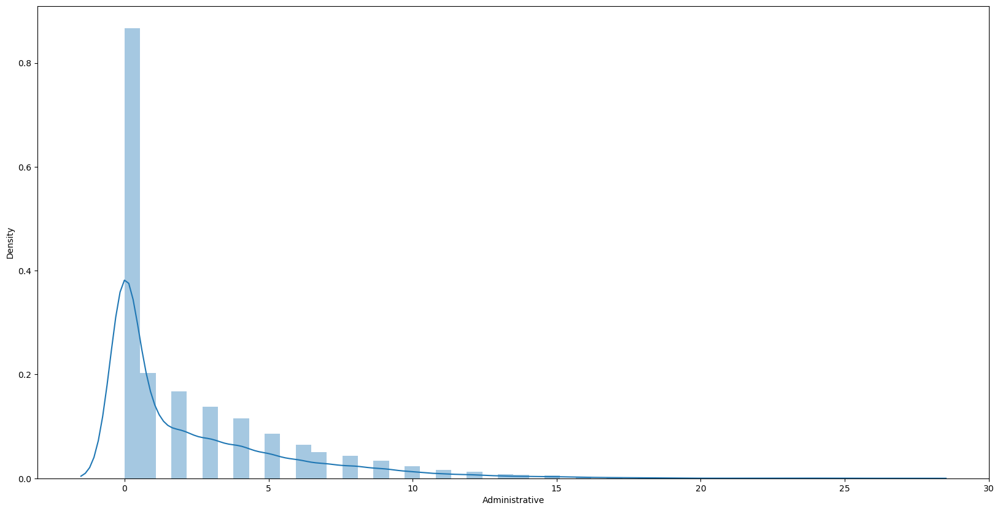

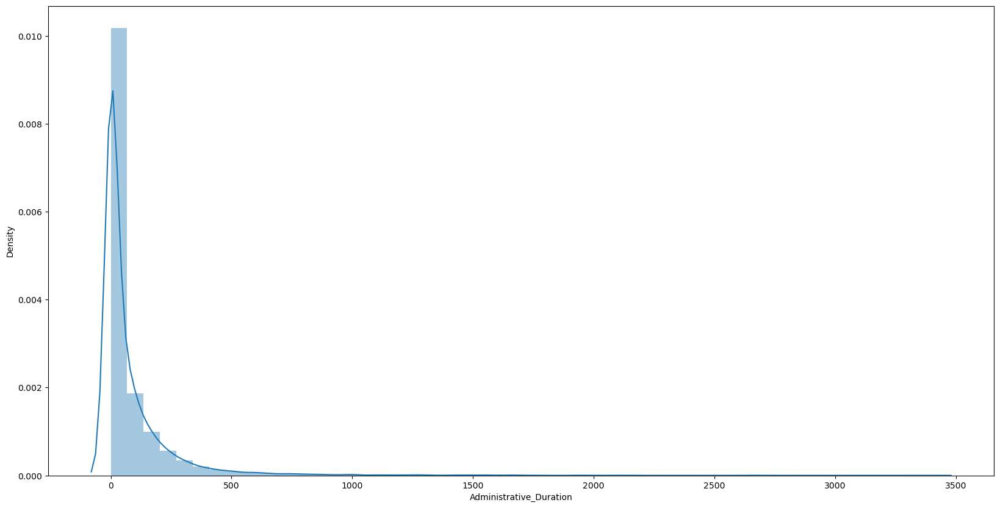

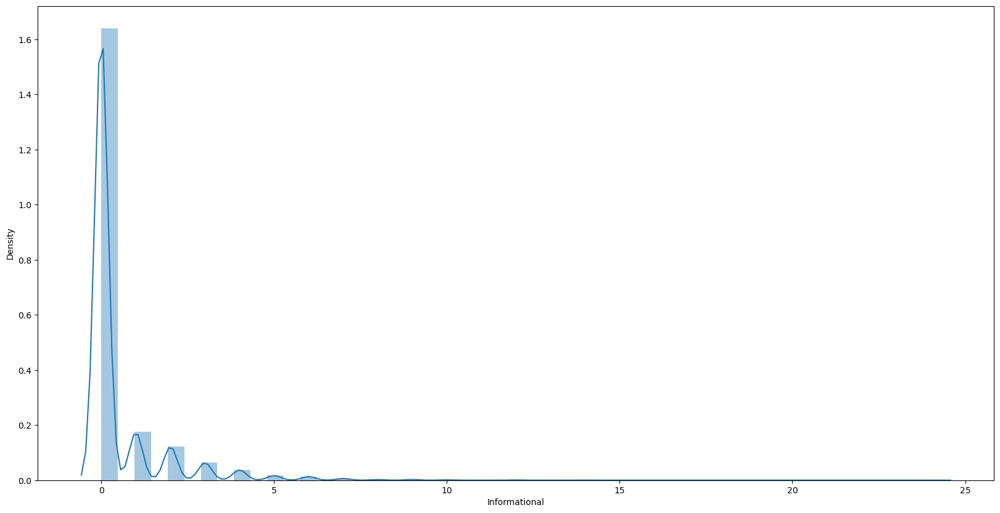

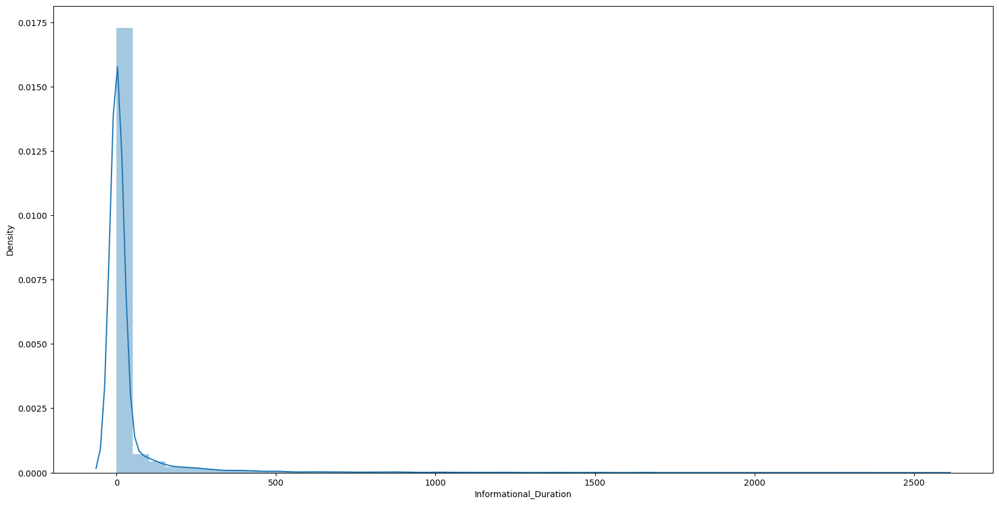

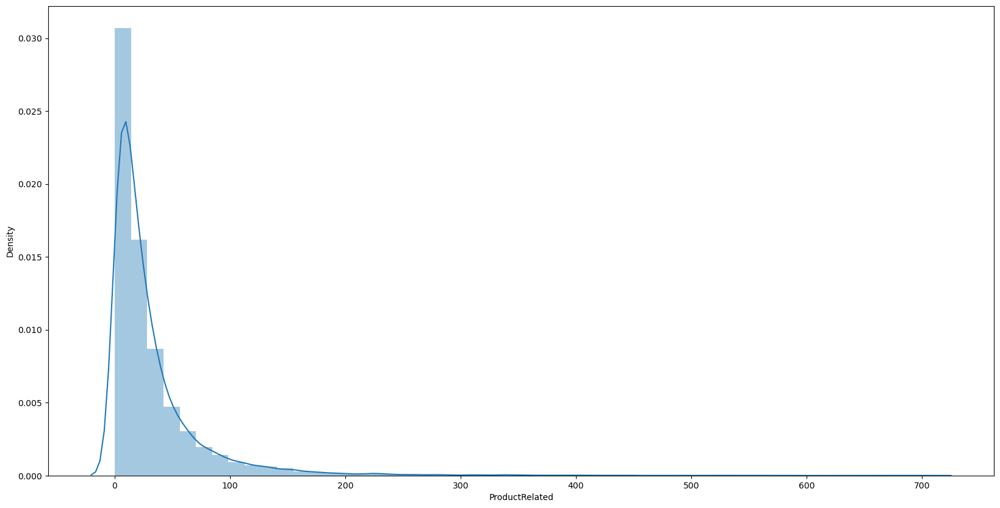

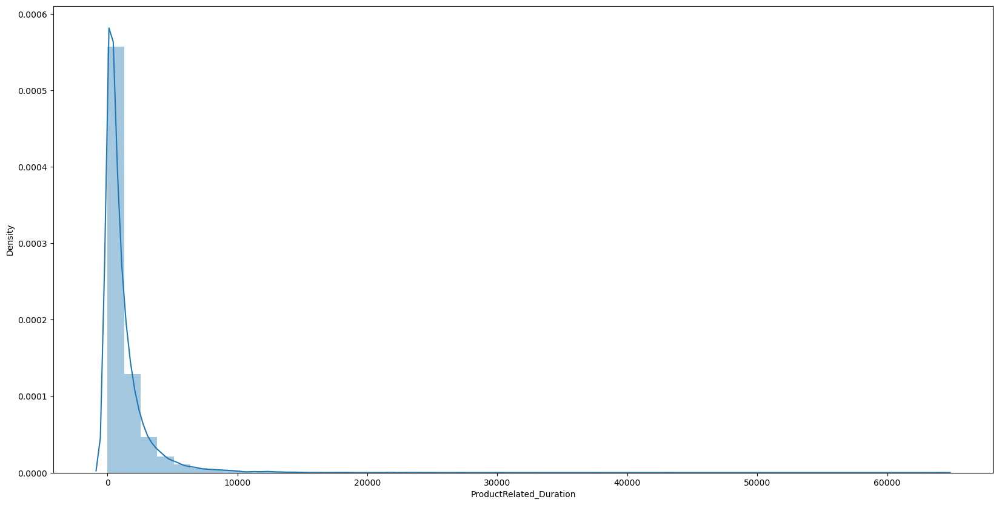

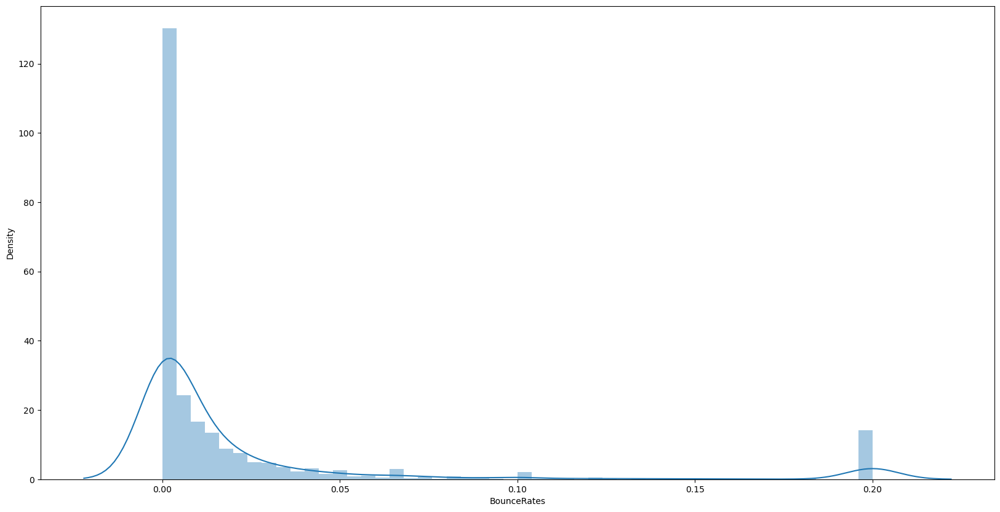

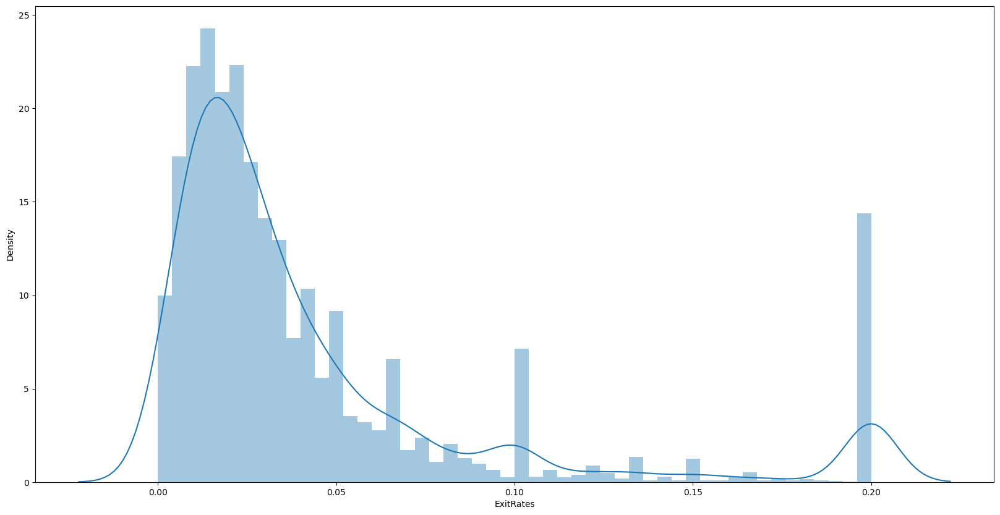

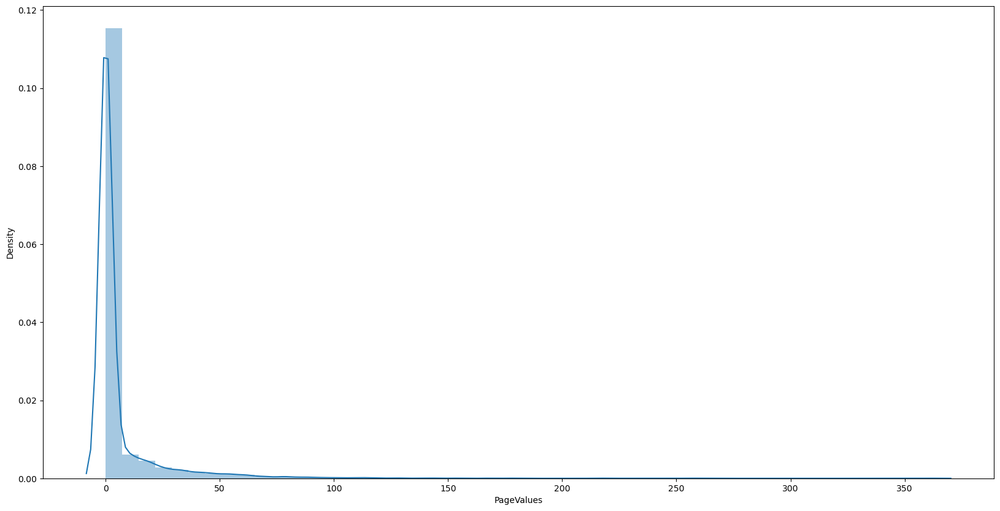

In [22]:
#numeric - distplot
for i in num:
    sns.distplot(df[i])
    plt.show()


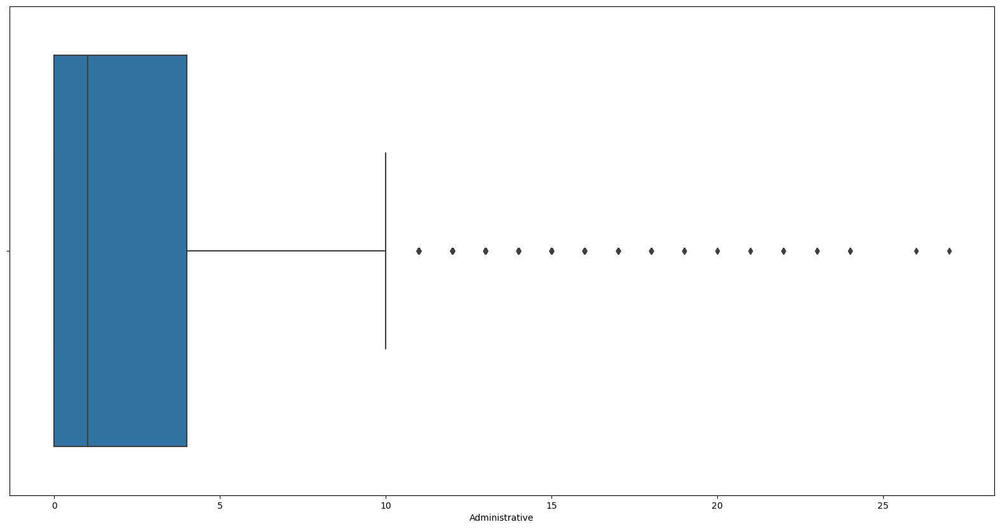

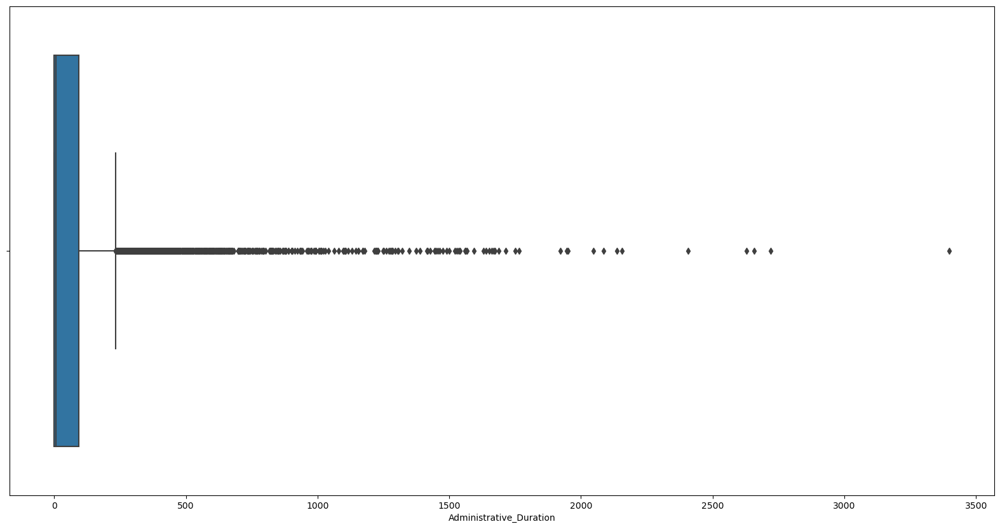

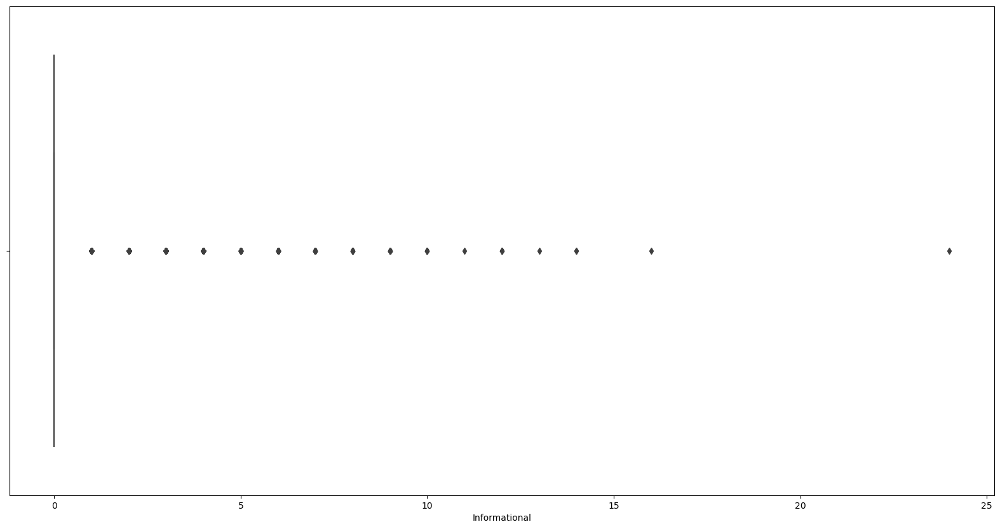

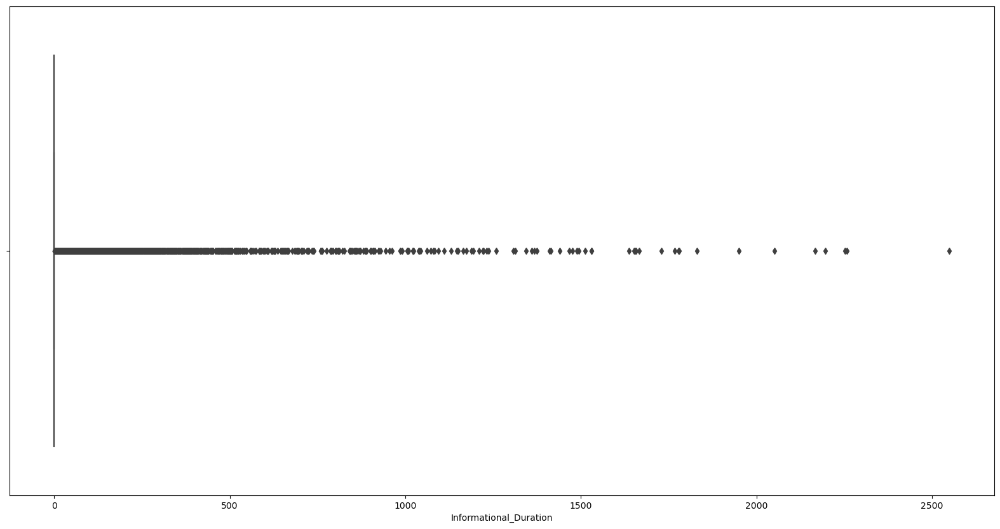

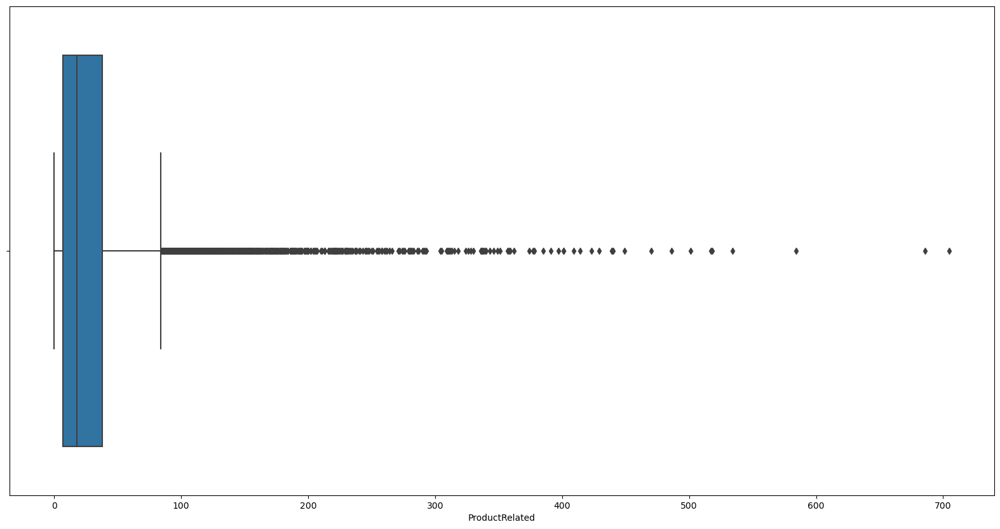

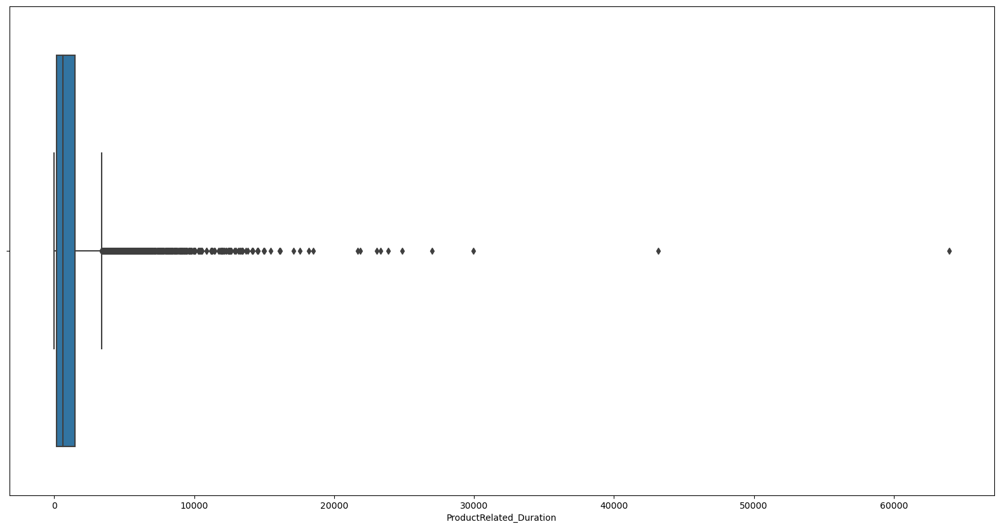

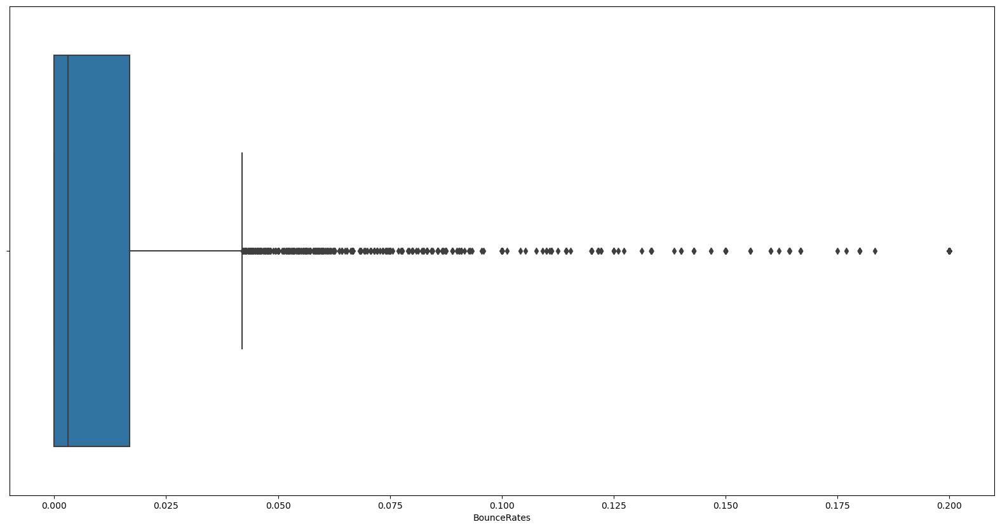

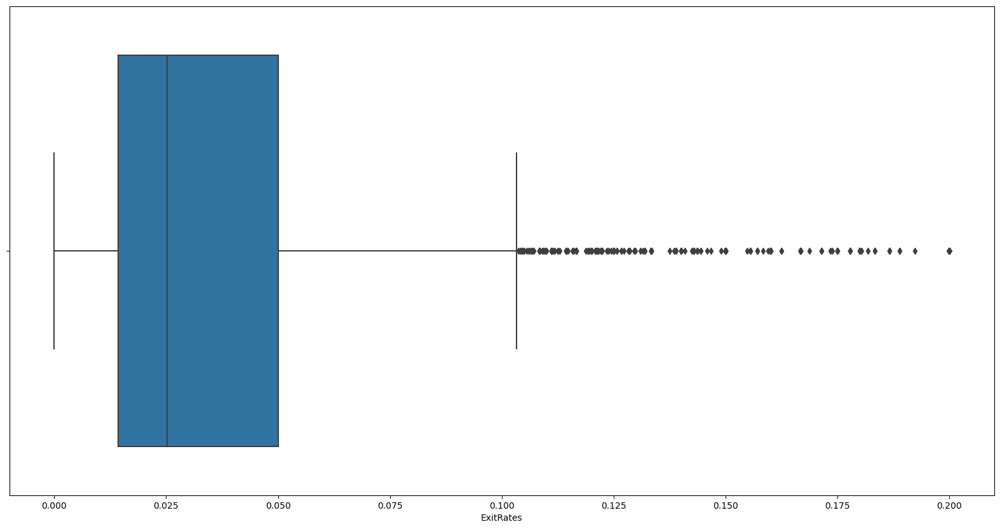

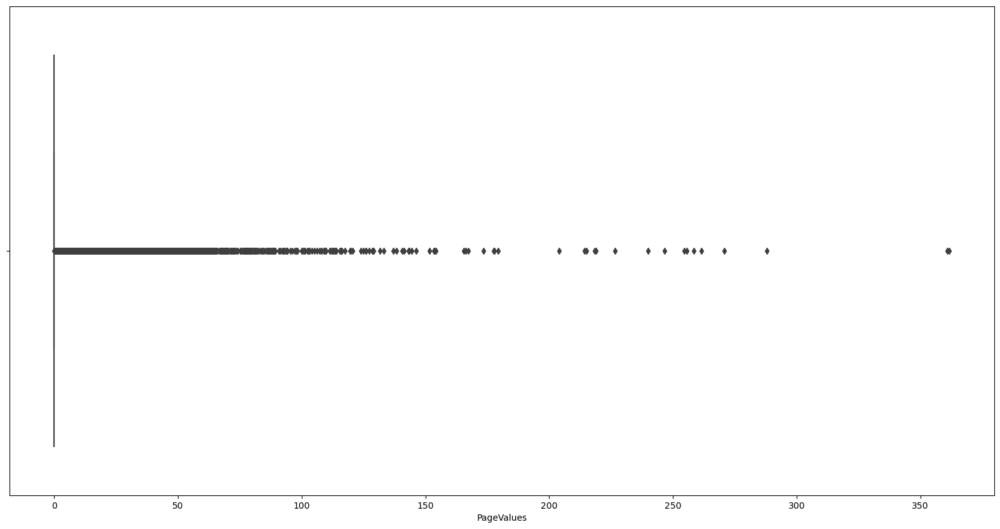

In [23]:
#numeric - boxplot
for i in num:
    sns.boxplot(df[i])
    plt.show()

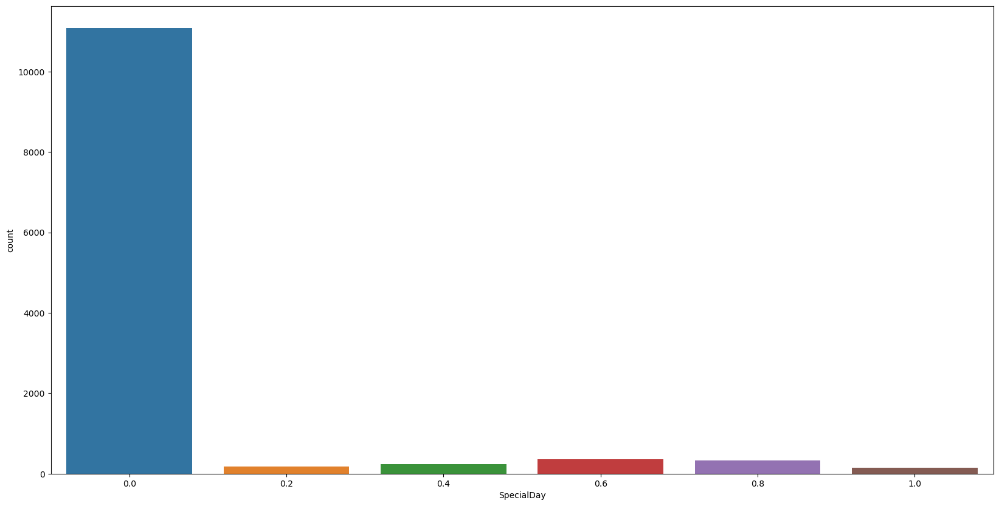

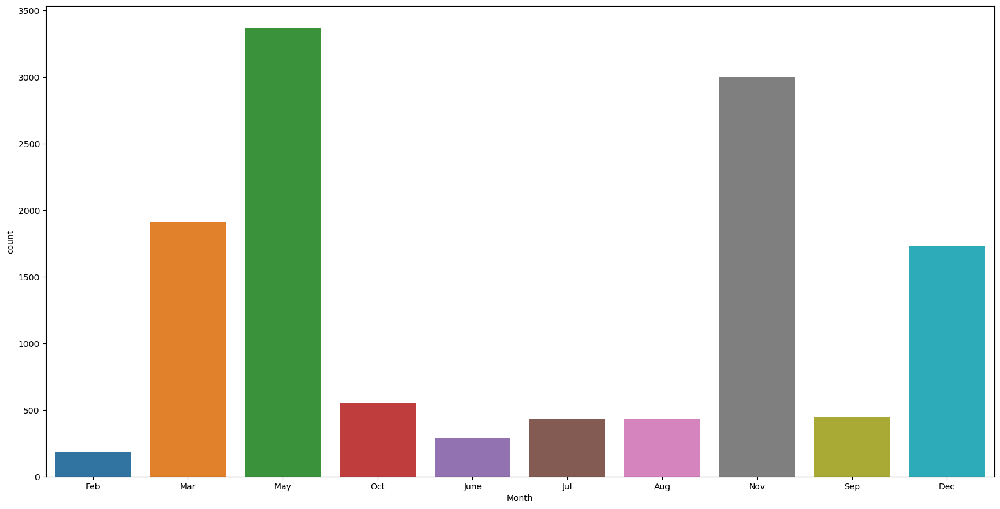

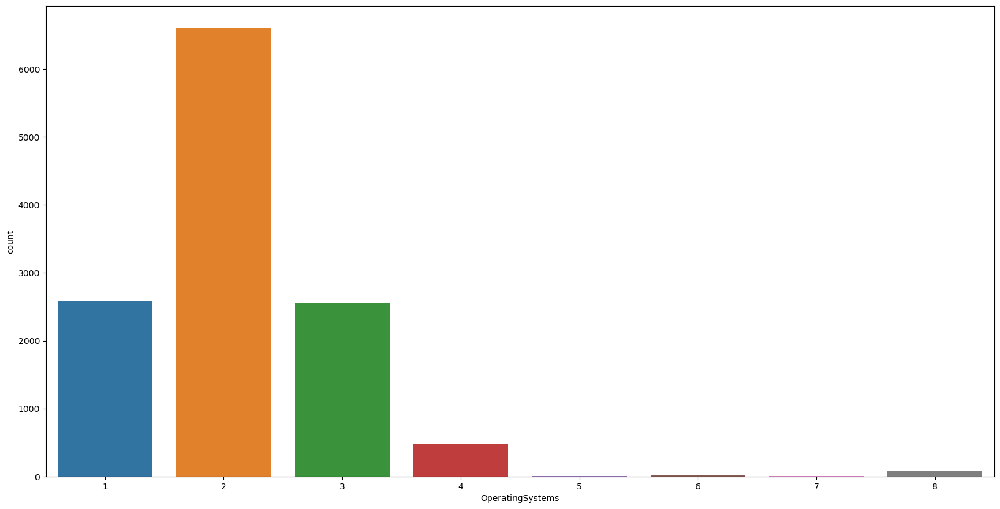

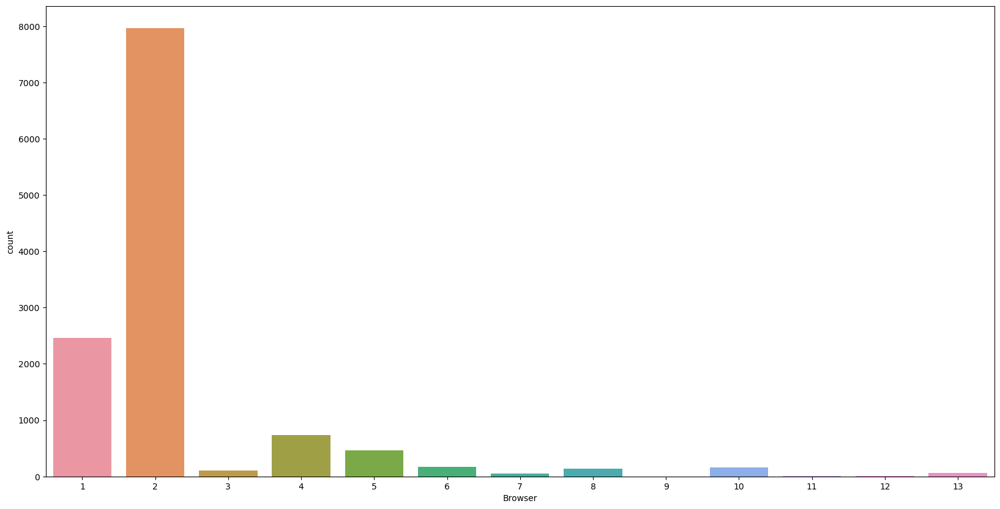

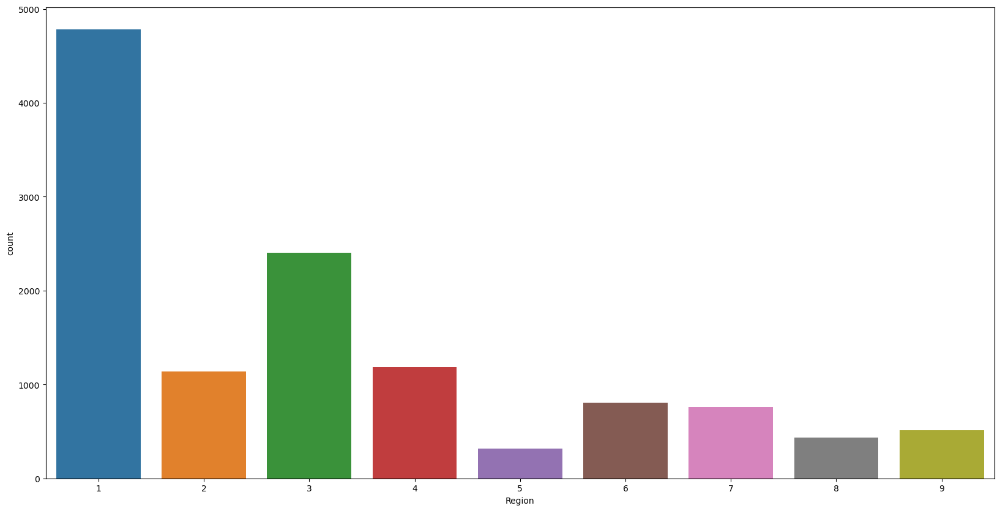

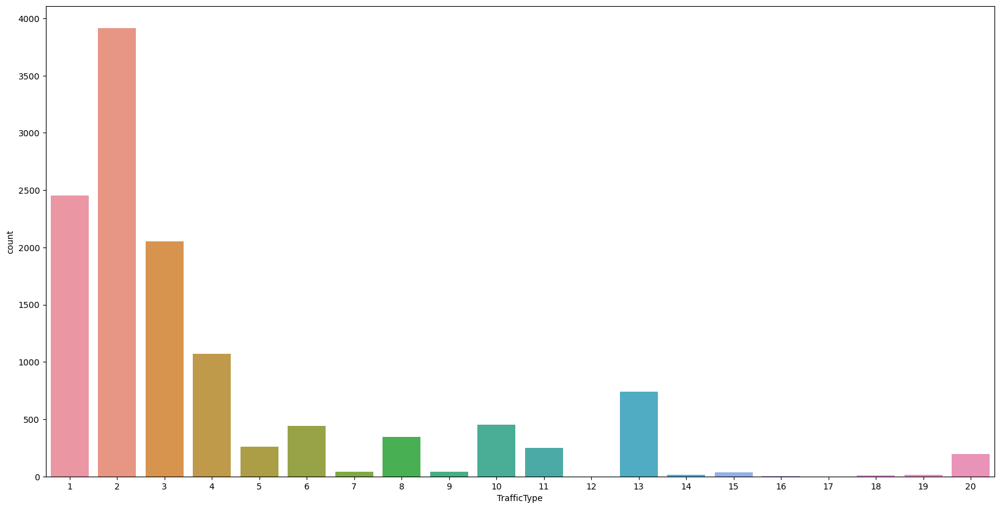

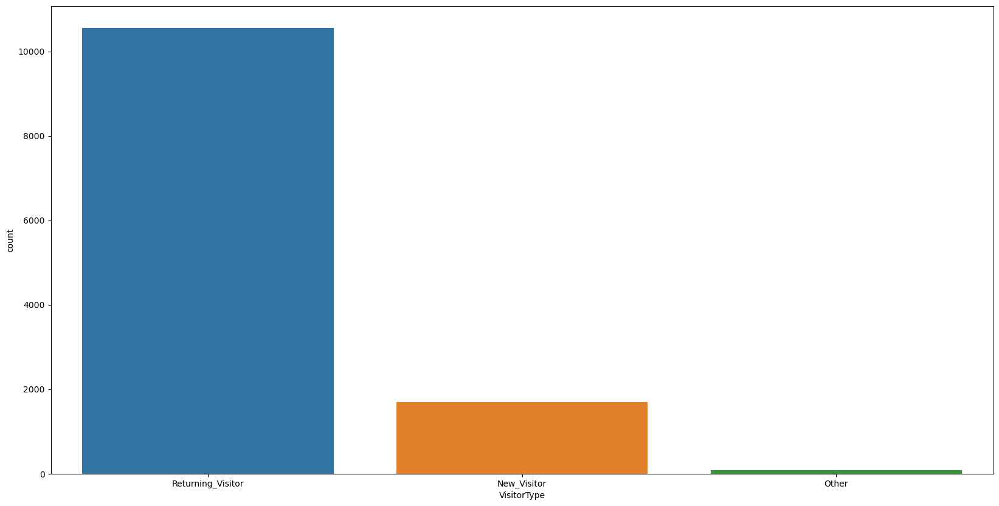

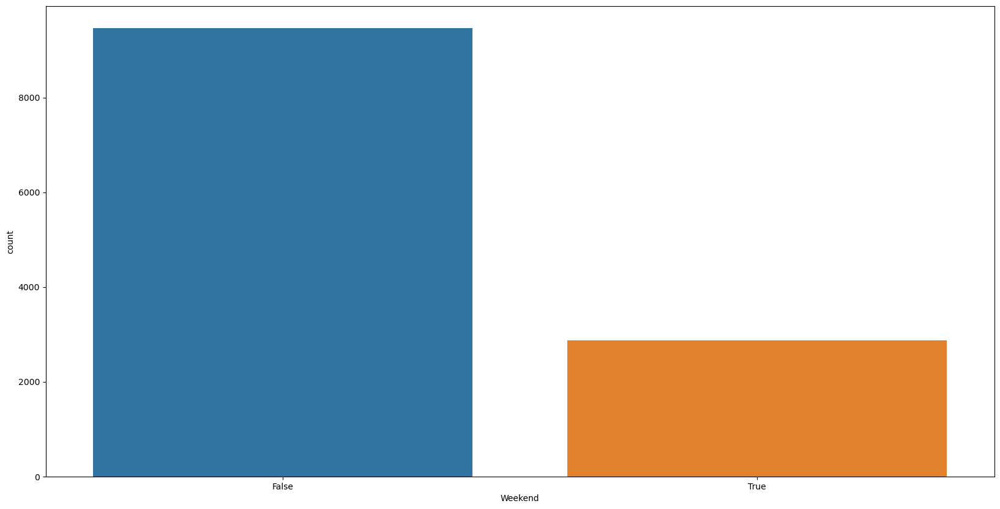

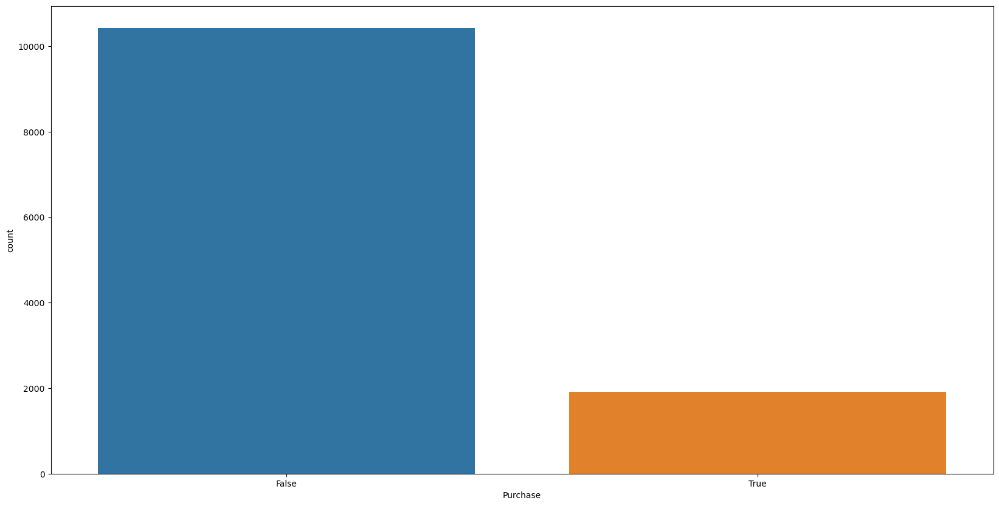

In [24]:
#categorical - countplot
for i in cat:
    sns.countplot(df[i])
    plt.show()

### Bivariate Analysis

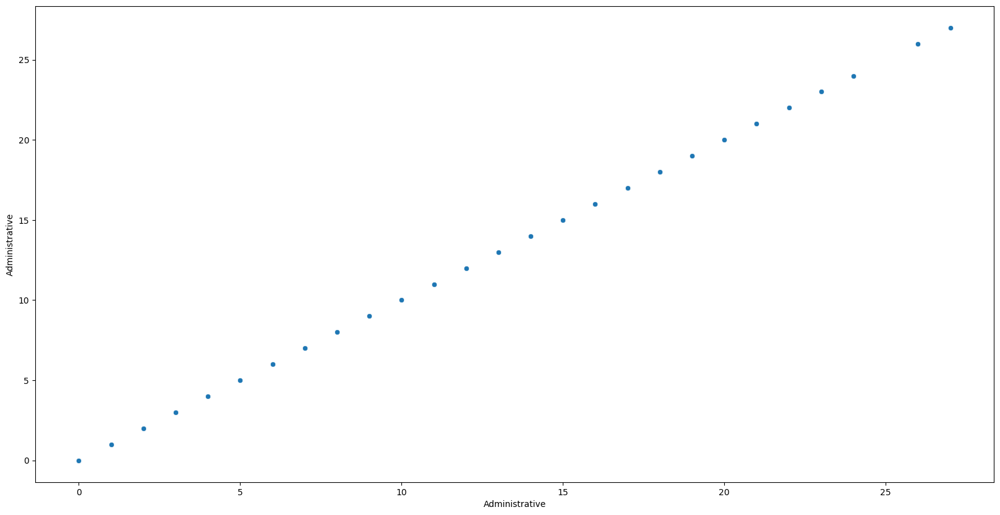

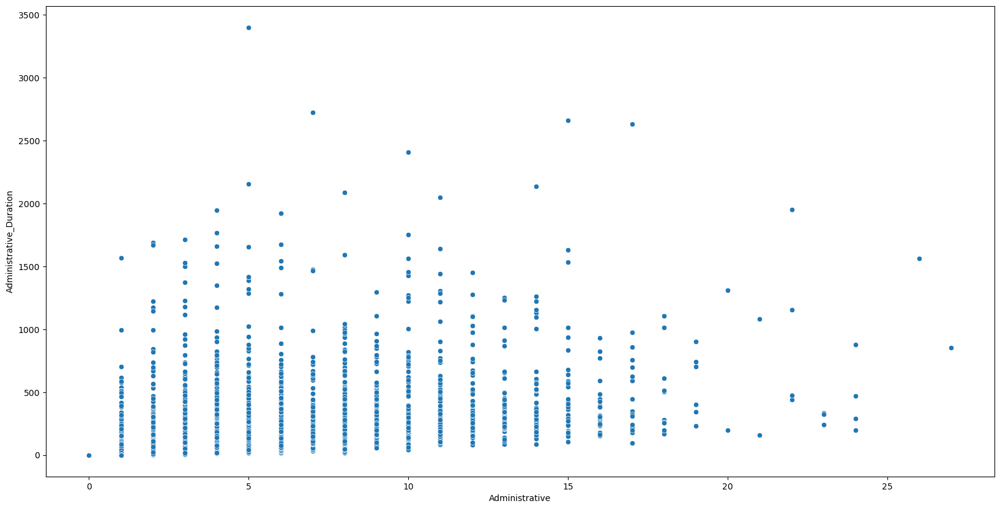

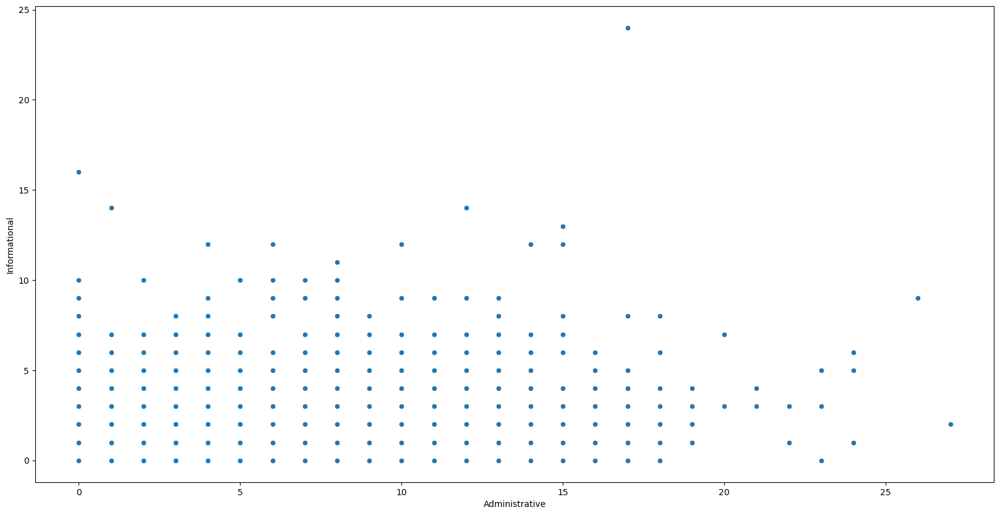

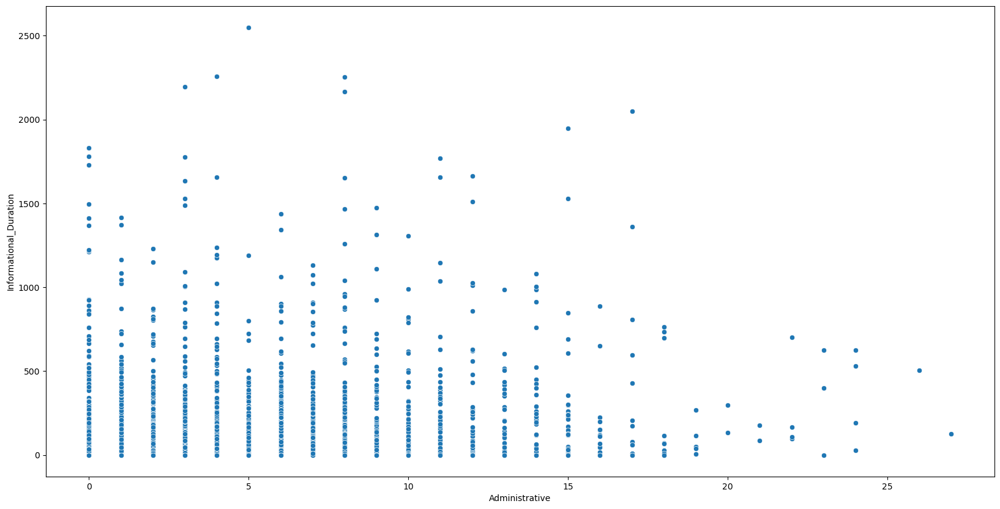

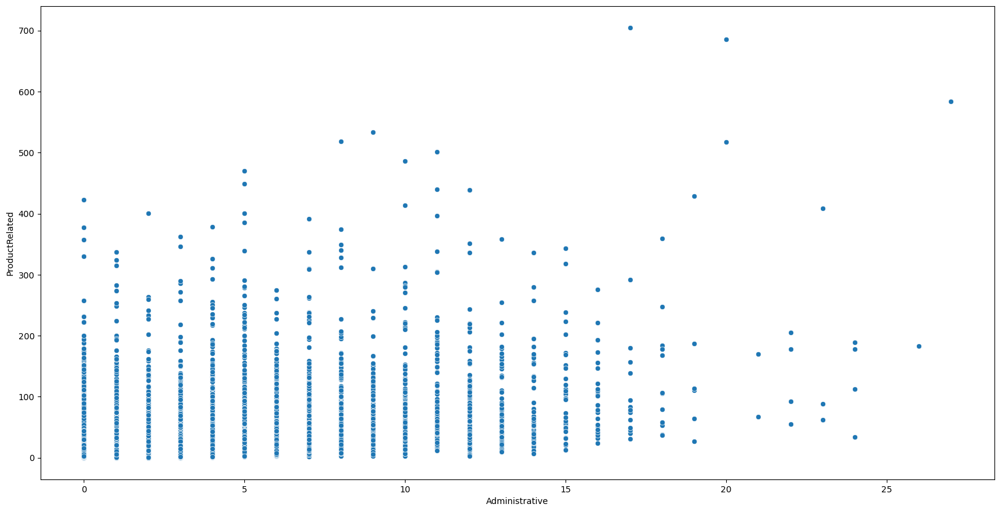

...

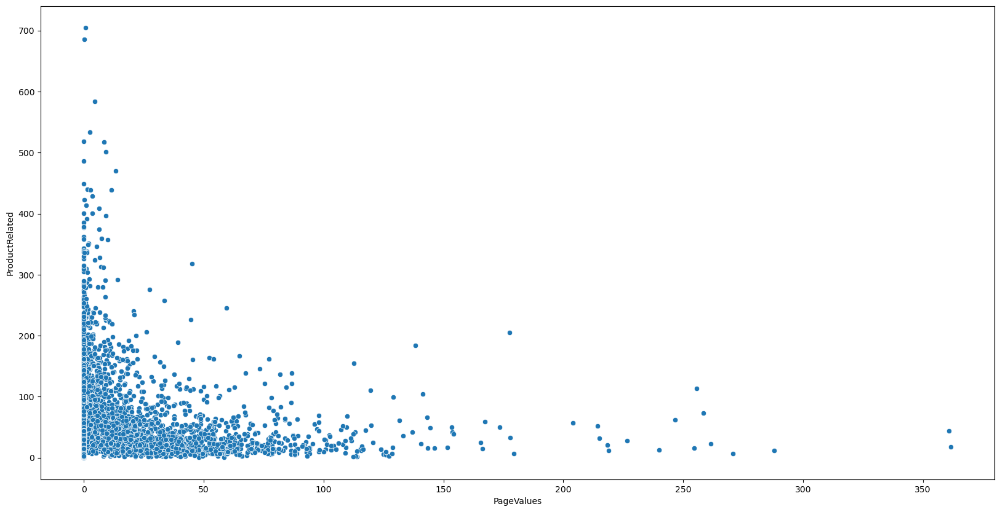

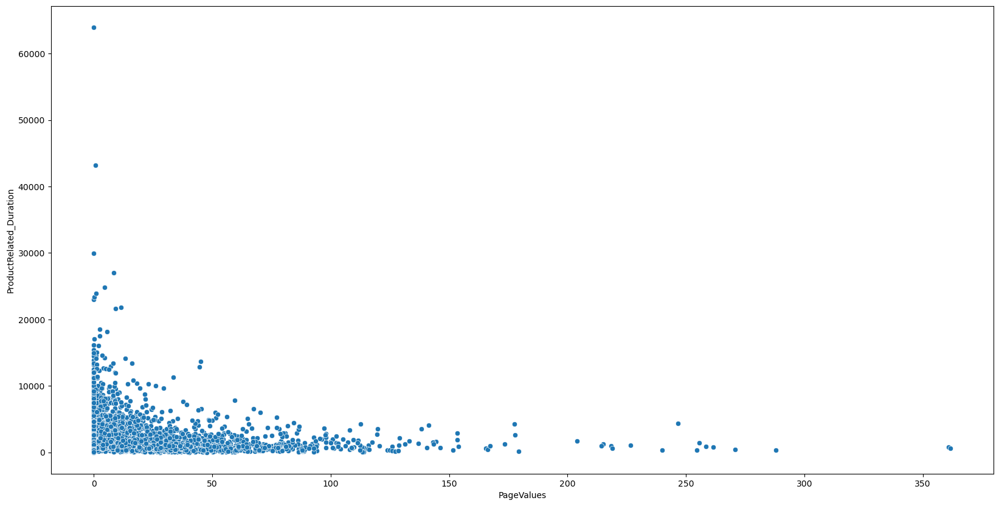

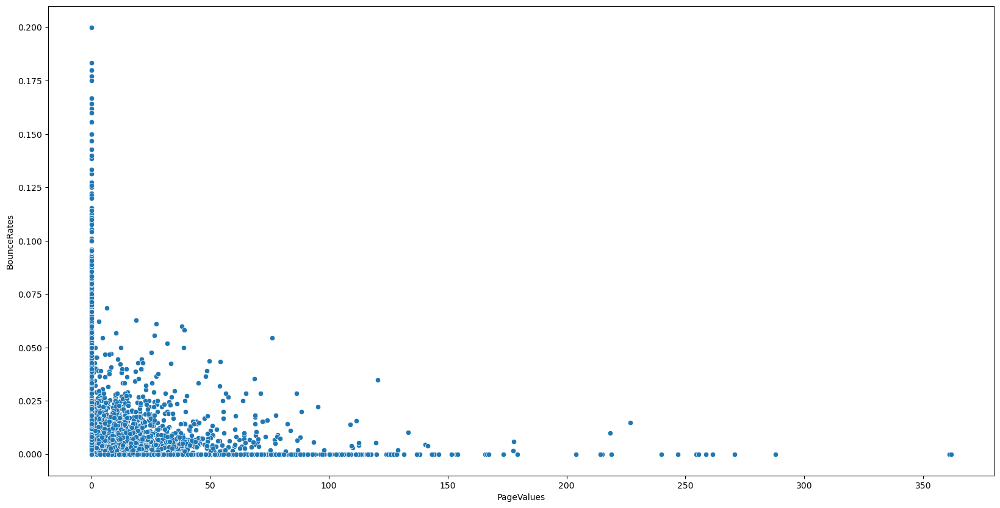

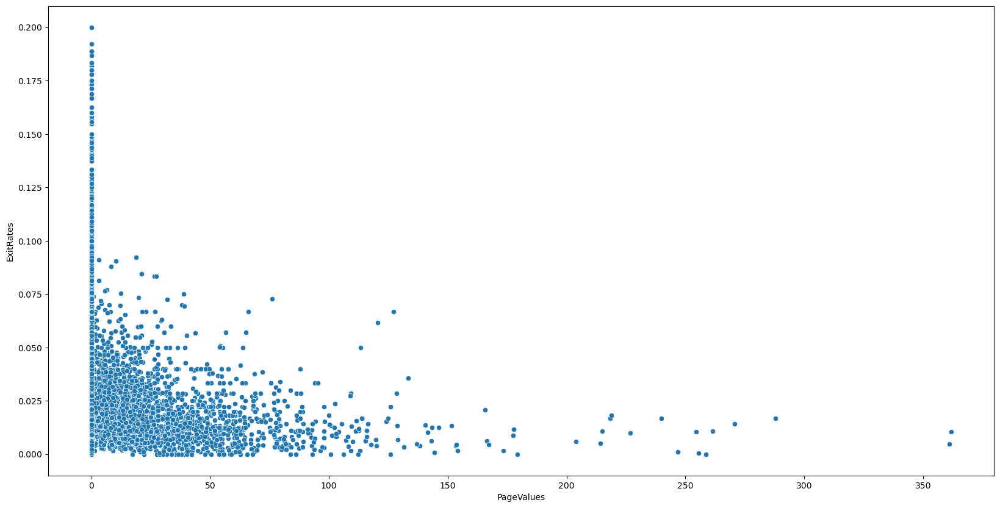

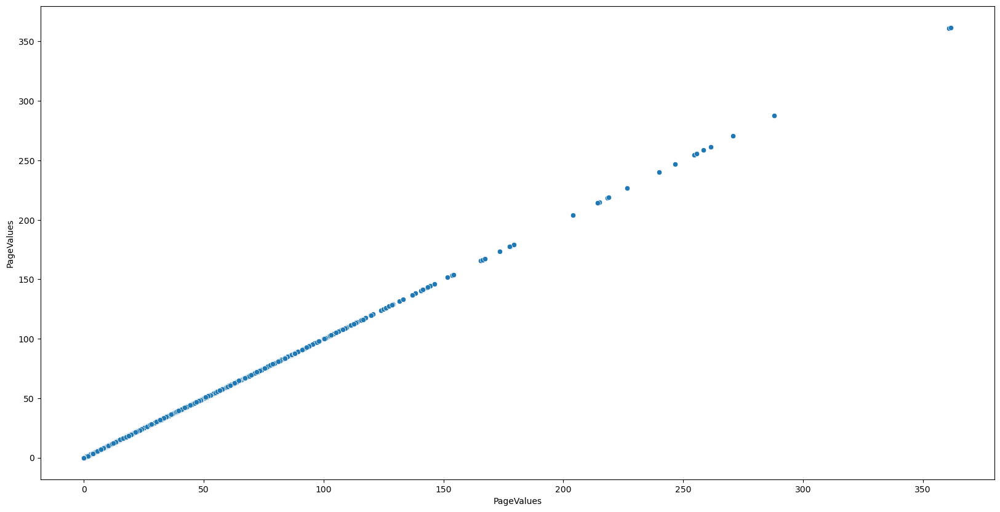

In [25]:
#Numeric vs Numeric
for i in num:
    for j in num:
        sns.scatterplot(df[i],df[j])
        plt.show()

* There is no linear relationship between the numeric columns. Let us analysis it with further methods

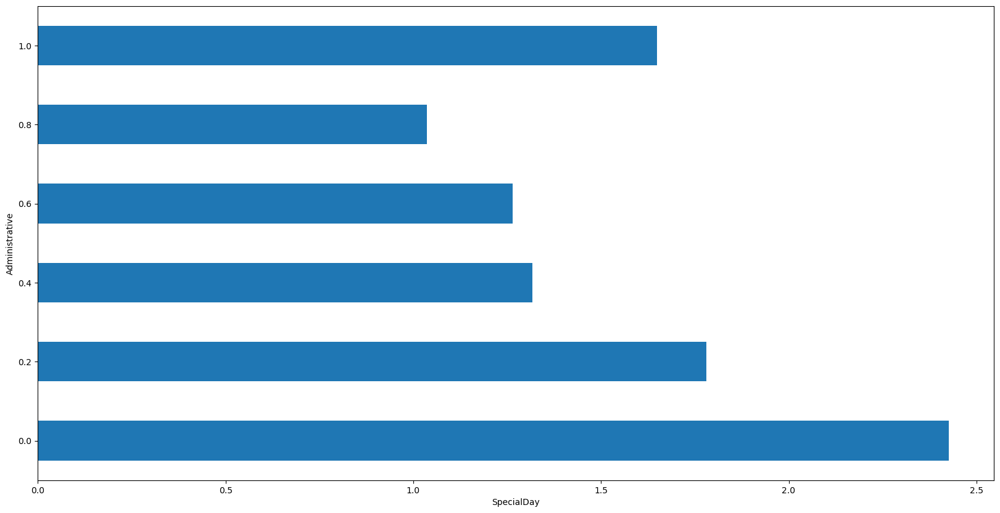

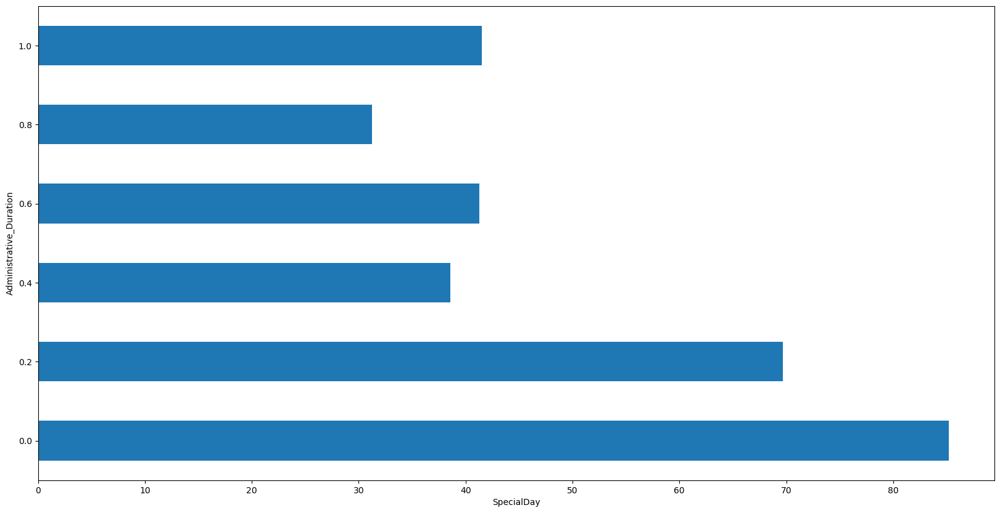

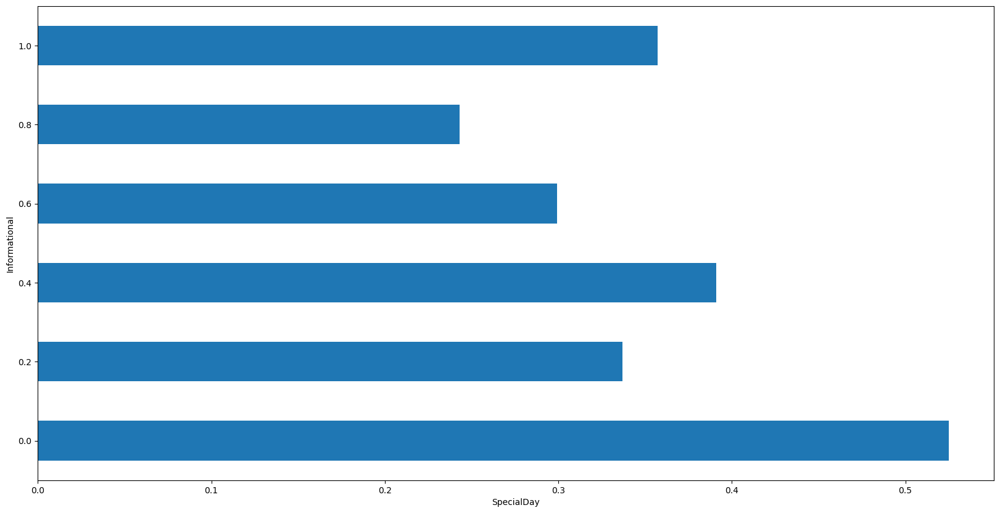

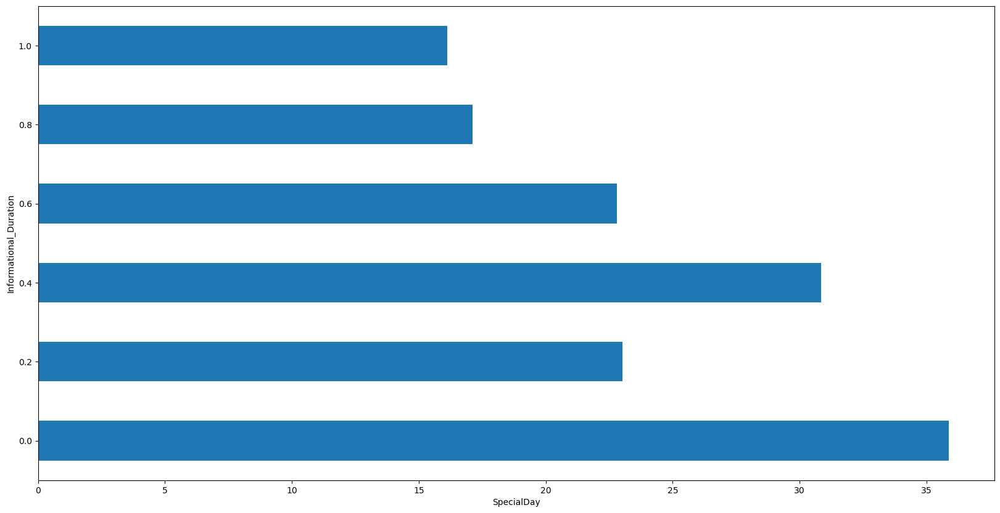

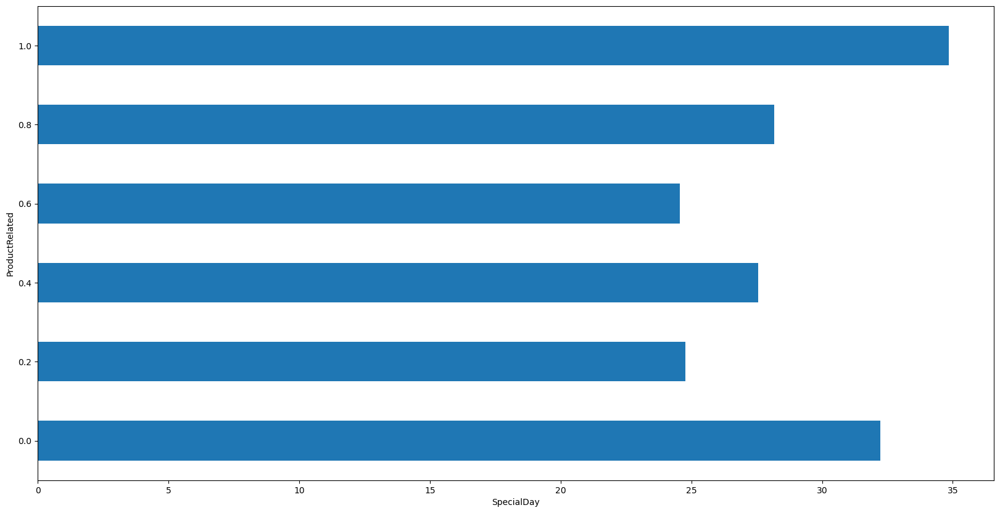

...

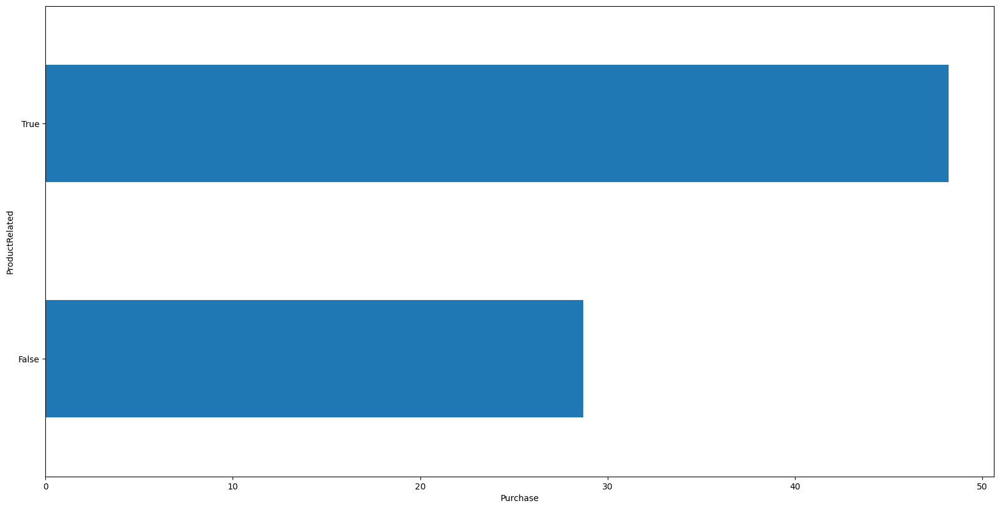

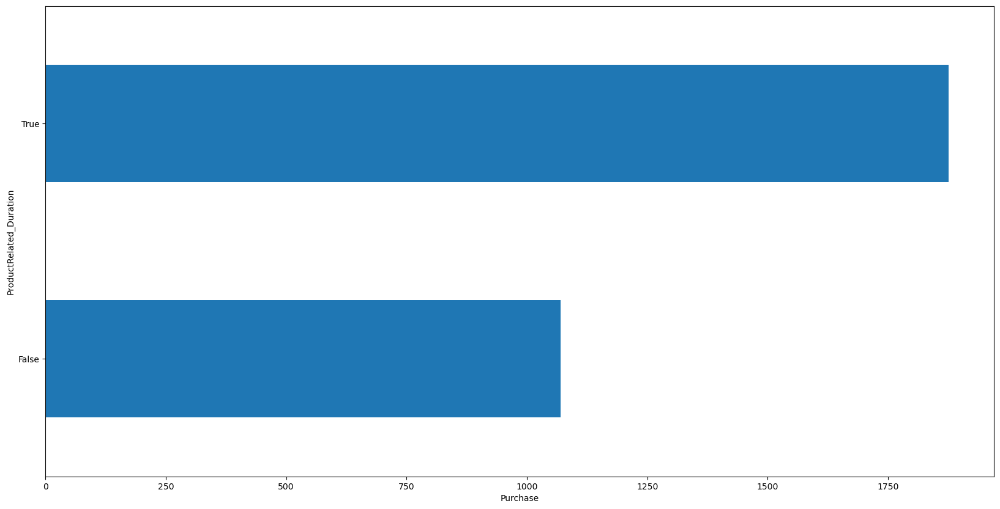

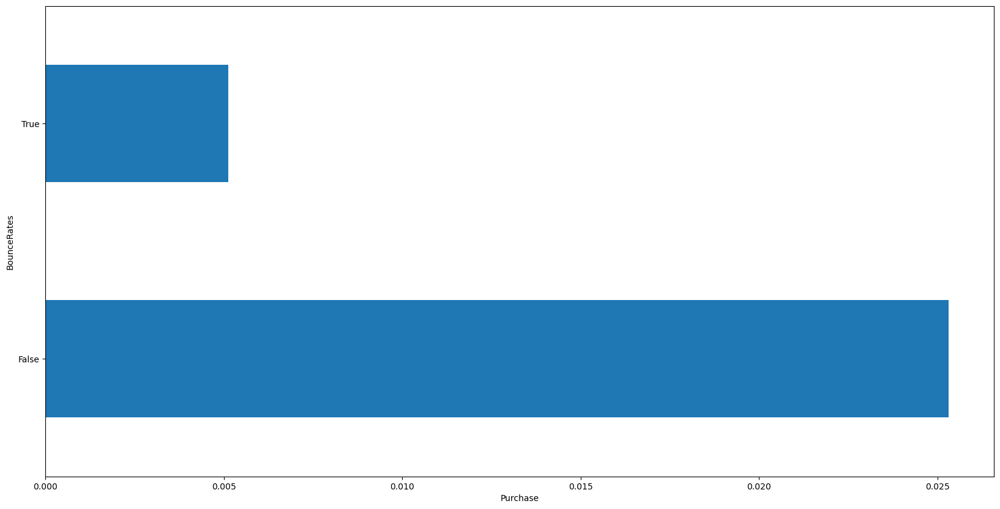

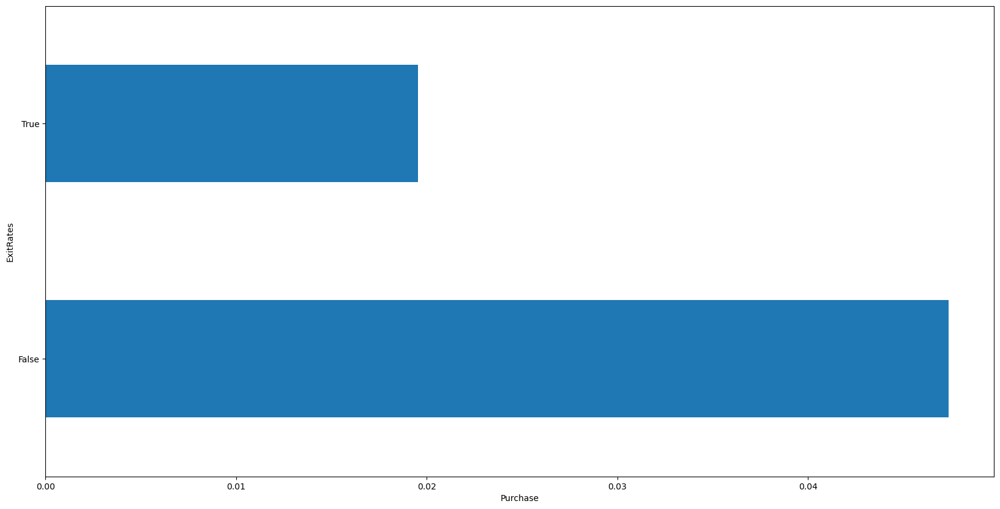

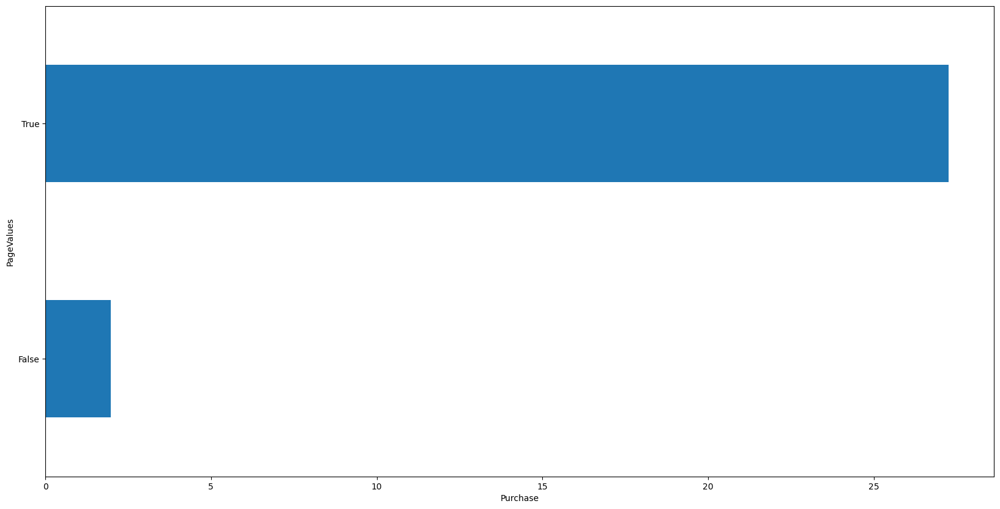

In [26]:
#This gives the all possible visual of the relations between mean of each categorical variables with respect to each numeric variables 

for i in cat:
    for j in num:
        df.groupby(by=df[i])[j].mean().plot(kind='barh')
        plt.xlabel(i)
        plt.ylabel(j)
        plt.show()

### Multivariate analysis

In [27]:
c=df[num].corr()
c

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues
Administrative,1.000000,0.601583,0.376850,0.255848,0.431119,0.373939,-0.223563,-0.316483,0.098990
Administrative_Duration,0.601583,1.000000,0.302710,0.238031,0.289087,0.355422,-0.144170,-0.205798,0.067608
Informational,0.376850,0.302710,1.000000,0.618955,0.374164,0.387505,-0.116114,-0.163666,0.048632
Informational_Duration,0.255848,0.238031,0.618955,1.000000,0.280046,0.347364,-0.074067,-0.105276,0.030861
ProductRelated,0.431119,0.289087,0.374164,0.280046,1.000000,0.860927,-0.204578,-0.292526,0.056282
ProductRelated_Duration,0.373939,0.355422,0.387505,0.347364,0.860927,1.000000,-0.184541,-0.251984,0.052823
BounceRates,-0.223563,-0.144170,-0.116114,-0.074067,-0.204578,-0.184541,1.000000,0.913004,-0.119386
ExitRates,-0.316483,-0.205798,-0.163666,-0.105276,-0.292526,-0.251984,0.913004,1.000000,-0.174498
PageValues,0.098990,0.067608,0.048632,0.030861,0.056282,0.052823,-0.119386,-0.174498,1.000000


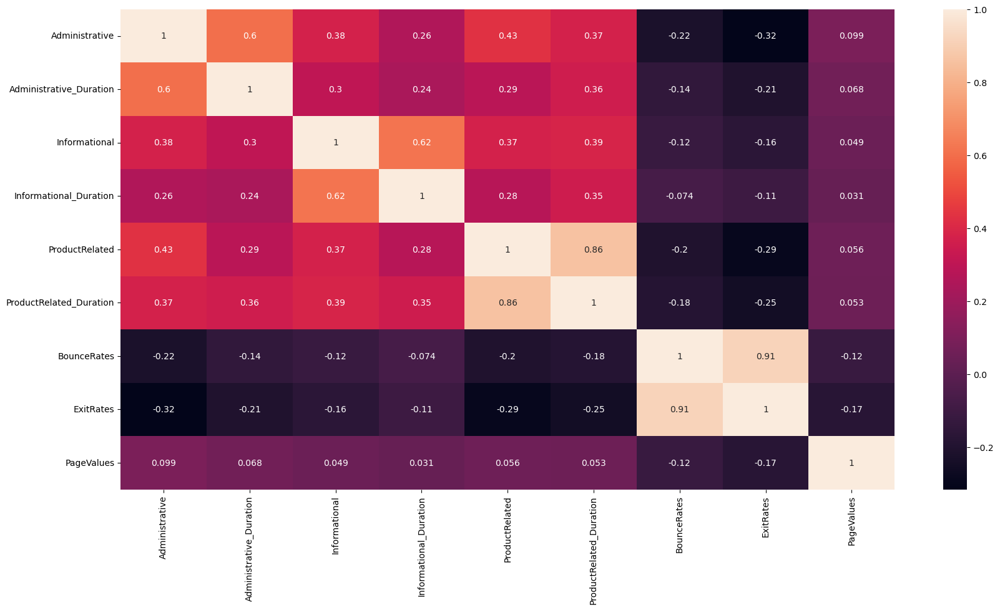

In [28]:
sns.heatmap(c,annot=True)
plt.show()

* From the above observation we can see that the columns BounceRates and ExitRates are correlated with each other with 0.91 which is nearly equals to 1 and it is strongly positively correlated
* Also we can see that the columns ProductRelated and ProductRelated_Duration are correlated with each other with 0.86 which is near to 1 and it is strongly positively correlated
* Also we can see that the columns Administarative and Administarative_Duration, Informational and Informational_Duration are correlated with each other with 0.6 which is positively correlated

# Check for Outliers 

In [29]:
df[num].skew()

Administrative             1.960357
Administrative_Duration    5.615719
Informational              4.036464
Informational_Duration     7.579185
ProductRelated             4.341516
ProductRelated_Duration    7.263228
BounceRates                2.947855
ExitRates                  2.148789
PageValues                 6.382964
dtype: float64

In [30]:
df[num].kurt()

Administrative               4.701146
Administrative_Duration     50.556739
Informational               26.932266
Informational_Duration      76.316853
ProductRelated              31.211707
ProductRelated_Duration    137.174164
BounceRates                  7.723159
ExitRates                    4.017035
PageValues                  65.635694
dtype: float64

* The columns Administrative_Duration, Informational_Duration , ProductRelated_Duration , PageValues are very much skewed which is greater than 5 

In [31]:
#using IQR method

q3 = df[num].quantile(0.75)
q1 = df[num].quantile(0.25)

In [32]:
iqr = q3-q1
iqr

Administrative                4.000000
Administrative_Duration      93.256250
Informational                 0.000000
Informational_Duration        0.000000
ProductRelated               31.000000
ProductRelated_Duration    1280.019714
BounceRates                   0.016813
ExitRates                     0.035714
PageValues                    0.000000
dtype: float64

In [33]:
uw = q3 + 3.5*iqr
uw

Administrative               18.000000
Administrative_Duration     419.653125
Informational                 0.000000
Informational_Duration        0.000000
ProductRelated              146.500000
ProductRelated_Duration    5944.226211
BounceRates                   0.075657
ExitRates                     0.175000
PageValues                    0.000000
dtype: float64

In [34]:
lw = q1 - 3.5*iqr
lw

Administrative              -14.000000
Administrative_Duration    -326.396875
Informational                 0.000000
Informational_Duration        0.000000
ProductRelated             -101.500000
ProductRelated_Duration   -4295.931497
BounceRates                  -0.058844
ExitRates                    -0.110714
PageValues                    0.000000
dtype: float64

In [35]:
filtered_data = df[(df[num] >= lw) & (df[num] <= uw)]
filtered_data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Purchase
0,0.0,0.0,0.0,0.0,1.0,0.000000,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,0.0,0.0,1.0,0.000000,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12327,0.0,0.0,0.0,0.0,6.0,184.250000,NaN,0.086667,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


* This filtered_data has the data without the outliers
* But there is need of these outliers because there are some datas lies in the outliers which can be useful to analyse the given data set
* So i am proceeding with the data set without removing the outliers 
* If neccessary we can remove it under some of the specific conditions

# Statistical Analysis using test

### CHI-SQUARE TEST - Purchase(Target) vs Month

In [36]:
df['Purchase']

0        False
1        False
2        False
3        False
4        False
         ...  
12325    False
12326    False
12327    False
12328    False
12329    False
Name: Purchase, Length: 12330, dtype: bool

In [37]:
df['Month']

0        Feb
1        Feb
2        Feb
3        Feb
4        Feb
        ... 
12325    Dec
12326    Nov
12327    Nov
12328    Nov
12329    Nov
Name: Month, Length: 12330, dtype: object

    Ho: There is no significant association between the "Purchase" and "Month" variables.
    Ha: There is significant association between the "Purchase" and "Month" variables.

In [38]:
obs =pd.crosstab(df['Month'],df['Purchase'])
obs

Purchase,False,True
Month,,
Aug,357,76
Dec,1511,216
Feb,181,3
Jul,366,66
June,259,29
Mar,1715,192
May,2999,365
Nov,2238,760
Oct,434,115


In [39]:
chistats , pval , degf , exp = stats.chi2_contingency(obs)


print('chi stats :', chistats)
print('pval :', pval)
print('Degree of freedom :', degf)
print('Exp :', exp)

chi stats : 384.93476153599426
pval : 2.2387855164805443e-77
Degree of freedom : 9
Exp : [[ 365.99562044   67.00437956]
 [1459.75620438  267.24379562]
 [ 155.5270073    28.4729927 ]
 [ 365.15036496   66.84963504]
 [ 243.43357664   44.56642336]
 [1611.90218978  295.09781022]
 [2843.43941606  520.56058394]
 [2534.07591241  463.92408759]
 [ 464.04525547   84.95474453]
 [ 378.67445255   69.32554745]]


    Considering Sig level = 0.05
    pval = 0 (near to 0)
    pval < sig level
    Ho is rejected
    
    
    Chistat = 384.93476153599426 and critical region value = 1.960
    
    Chistat is greater than critical region value 

    
    Conclusion: p value is lesser than significance level and hence accepting the alternate hypothesis
    Thus There is significant association between the "Purchase" and "Month" variables.

### ANOVA - Administrative_Duration VS VisitorType

In [40]:
a = df[df['VisitorType'] == 'Returning_Visitor']['Administrative_Duration']
b = df[df['VisitorType'] == 'New_Visitor']['Administrative_Duration']
c = df[df['VisitorType'] == 'Other']['Administrative_Duration']

    To check the normality (shapiro):

        Ho: Data are normal
        Ha: Data are not normal

In [41]:
print(stats.shapiro(a))
print(stats.shapiro(b))
print(stats.shapiro(c))

ShapiroResult(statistic=0.47321462631225586, pvalue=0.0)
ShapiroResult(statistic=0.5309206247329712, pvalue=0.0)
ShapiroResult(statistic=0.3219900131225586, pvalue=6.0147879894879934e-18)


    Considering Sig level = 0.05
    pval of a,b,c are  less than sig level
    Ho is reject
    Thus the datas are not normal


    To check that all variance are same or not 
    Levene test

    Ho: All variance are same
    Ha: All variance are not same

In [42]:
stats.levene(a,b,c)

LeveneResult(statistic=0.46527827763436086, pvalue=0.6279713611896804)

    Sig level = 0.05
    pval is 0.6 which is greater than sig level
    Ho is fails to reject
    Thus all variance are same


    Even the datas are not normal but i assume that the datas are normal and of same variance 
    and i perform the parametric test

    Here we use one way ANOVA test(samples > 2)


    Ho: There is no significant difference between the means of the groups being compared
    Ha: Atleast one significant difference between the means of the groups 

In [43]:
stats.f_oneway(a,b,c)

F_onewayResult(statistic=4.2351523473870705, pvalue=0.014498675851145207)

    Sig level is 0.05
    Pval is 0.01
    Pval is less than sig level
    Ho is rejected
    
    Atleast one significant difference between the means of the groups
    
    Thus Ho is rejected we go for Post Hoc(tukeyhsd)

In [44]:
import statsmodels.stats.multicomp as mc

In [45]:
mc.pairwise_tukeyhsd(df['Administrative_Duration'],df['VisitorType']).summary()

group1,group2,meandiff,p-adj,lower,upper,reject
New_Visitor,Other,-29.2157,0.2971,-75.2619,16.8304,False
New_Visitor,Returning_Visitor,-12.7277,0.0164,-23.5706,-1.8847,True
Other,Returning_Visitor,16.4881,0.6677,-28.6252,61.6014,False


    The mean salary of group 1 and group 2 are different ie, all mean values are different

# Encoding

In [46]:
df[cat]

,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Purchase
0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...
12325,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [47]:
category = ['SpecialDay',
 'Month',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType',
 'VisitorType',
 'Weekend']

In [48]:
df[category]

,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
0,0.0,Feb,1,1,1,1,Returning_Visitor,False
1,0.0,Feb,2,2,1,2,Returning_Visitor,False
2,0.0,Feb,4,1,9,3,Returning_Visitor,False
3,0.0,Feb,3,2,2,4,Returning_Visitor,False
4,0.0,Feb,3,3,1,4,Returning_Visitor,True
...,...,...,...,...,...,...,...,...
12325,0.0,Dec,4,6,1,1,Returning_Visitor,True
12326,0.0,Nov,3,2,1,8,Returning_Visitor,True
12327,0.0,Nov,3,2,1,13,Returning_Visitor,True
12328,0.0,Nov,2,2,3,11,Returning_Visitor,False


In [49]:
df1=pd.get_dummies(data=df,columns = category, drop_first=True)
df1

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,Purchase,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,False,...,0,0,0,0,0,0,0,0,1,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,False,...,0,0,0,0,0,0,0,0,1,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,False,...,0,0,0,0,0,0,0,0,1,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,False,...,0,0,0,0,0,0,0,0,1,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,False,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,False,...,0,0,0,0,0,0,0,0,1,1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,False,...,0,0,0,0,0,0,0,0,1,1
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,False,...,0,0,0,0,0,0,0,0,1,1
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,False,...,0,0,0,0,0,0,0,0,1,0


In [50]:
df1.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'Purchase', 'SpecialDay_0.2',
       'SpecialDay_0.4', 'SpecialDay_0.6', 'SpecialDay_0.8', 'SpecialDay_1.0',
       'Month_Dec', 'Month_Feb', 'Month_Jul', 'Month_June', 'Month_Mar',
       'Month_May', 'Month_Nov', 'Month_Oct', 'Month_Sep',
       'OperatingSystems_2', 'OperatingSystems_3', 'OperatingSystems_4',
       'OperatingSystems_5', 'OperatingSystems_6', 'OperatingSystems_7',
       'OperatingSystems_8', 'Browser_2', 'Browser_3', 'Browser_4',
       'Browser_5', 'Browser_6', 'Browser_7', 'Browser_8', 'Browser_9',
       'Browser_10', 'Browser_11', 'Browser_12', 'Browser_13', 'Region_2',
       'Region_3', 'Region_4', 'Region_5', 'Region_6', 'Region_7', 'Region_8',
       'Region_9', 'TrafficType_2', 'TrafficType_3', 'TrafficType_4',
       'TrafficType_5', 'TrafficType_6', 'TrafficType

* I did Onehot encoding for the columns.
* I prefer Onehot encoding method so that during the model building, the model wont get biased with any of the column values and it equally analyse the values to predict the target

In [51]:
# encoding the target columns 

d = { True : 1 , False : 0}

df1['Purchase'] = df['Purchase'].map(d)

In [52]:
df1

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,Purchase,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0,...,0,0,0,0,0,0,0,0,1,1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0,...,0,0,0,0,0,0,0,0,1,1
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0,...,0,0,0,0,0,0,0,0,1,1
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0,...,0,0,0,0,0,0,0,0,1,0


In [53]:
df1.Purchase

0        0
1        0
2        0
3        0
4        0
        ..
12325    0
12326    0
12327    0
12328    0
12329    0
Name: Purchase, Length: 12330, dtype: int64

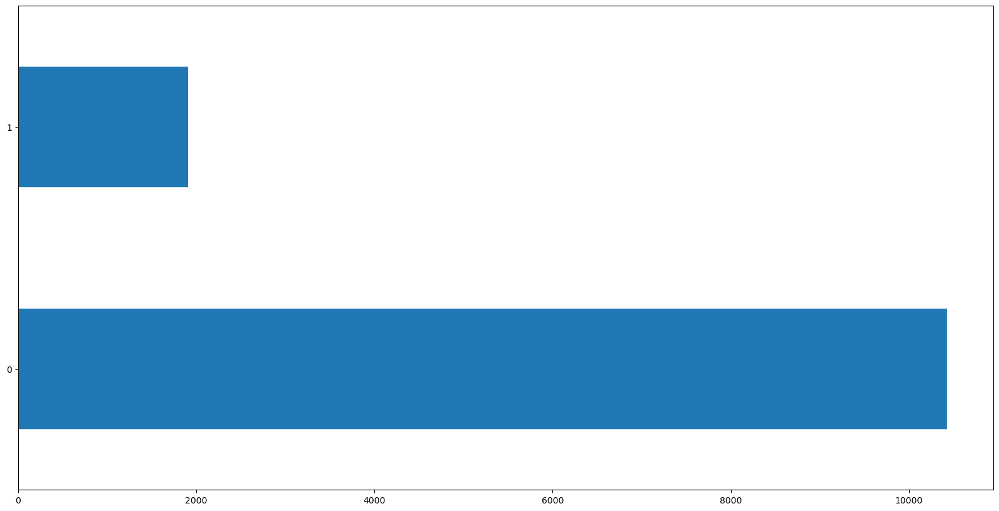

In [54]:
df1.Purchase.value_counts().plot(kind='barh')
plt.show()

* The data is imbalanced

# Transformation

* The numeric data are skewed and it is right skewed so we can transform it into normal distribution

In [55]:
## Checking for negative values 

negative_cols = df1.columns[(df1 < 0).any()]

print("Columns with negative values:", list(negative_cols))

Columns with negative values: []


In [56]:
p = PowerTransformer()
df1[num] = p.fit_transform(df1[num])

In [57]:
df1[num].skew()

Administrative             0.243728
Administrative_Duration    0.145485
Informational              1.404111
Informational_Duration     1.546903
ProductRelated            -0.002576
ProductRelated_Duration   -0.036336
BounceRates                1.032599
ExitRates                  0.433598
PageValues                 1.377420
dtype: float64

* The skewness is reduced to an extend
* We can proceed with the above dataset df1

# Train Test Split

In [58]:
x = df1.drop('Purchase',axis = 1 )
y = df1['Purchase']

In [59]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.3,stratify=y,random_state=100)

* The data is imbalanced
* So we are doing stratify sampling for the balance 

In [60]:
print('x train',xtrain.shape)
print('x test',xtest.shape)
print('y train',ytrain.shape)
print('y test',ytest.shape)

x train (8631, 72)
x test (3699, 72)
y train (8631,)
y test (3699,)


# Scaling

* We want to split the data as train and test and then do scaling
* Apply .fit_transform() in train data on doings scaling
* Apply .transform() in test data on doings scaling

In [61]:
xtrain_sc = xtrain.copy()
xtest_sc = xtest.copy()

In [62]:
num

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues']

In [63]:
s = StandardScaler()

xtrain_sc[num] = s.fit_transform(xtrain[num])
xtest_sc[num] = s.transform(xtest[num])

In [64]:
xtrain_sc

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay_0.2,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
8018,-0.994164,-0.999483,-0.517306,-0.489069,0.293766,0.042816,-0.794628,-0.399606,-0.531427,0,...,0,0,0,0,0,0,0,0,1,1
96,-0.994164,-0.999483,-0.517306,-0.489069,-0.834886,0.708387,1.706940,1.103473,-0.531427,1,...,0,0,0,0,0,0,0,0,1,0
3868,-0.994164,-0.999483,-0.517306,-0.489069,0.937818,0.789875,-0.794628,-1.120844,-0.531427,1,...,0,0,0,0,0,0,0,0,1,0
9575,0.564531,0.875382,-0.517306,-0.489069,0.694462,0.604709,-0.794628,-1.428523,-0.531427,0,...,0,0,0,0,0,0,0,0,1,1
6630,-0.994164,-0.999483,-0.517306,-0.489069,-1.919504,-2.088235,2.202693,1.974285,-0.531427,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6823,0.088849,0.232876,-0.517306,-0.489069,0.457646,0.314703,-0.794628,-0.602436,1.864642,0,...,0,0,0,0,0,0,0,0,1,0
5699,-0.994164,-0.999483,-0.517306,-0.489069,-0.105012,-0.719043,-0.794628,0.412734,-0.531427,0,...,0,0,0,0,0,0,0,0,1,0
4391,0.564531,0.554951,-0.517306,-0.489069,0.328972,-0.235306,-0.081677,-1.149108,-0.531427,0,...,0,0,0,0,0,0,0,0,1,0
1157,1.563624,1.057863,-0.517306,-0.489069,0.427130,0.064653,0.628611,-0.299860,1.904138,0,...,0,0,0,0,0,0,0,0,1,0


In [65]:
xtest_sc

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay_0.2,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
5225,0.846580,1.283243,-0.517306,-0.489069,-0.614202,-0.772560,-0.794628,-1.213432,-0.531427,0,...,0,0,0,0,1,0,0,0,1,0
4144,-0.994164,-0.999483,-0.517306,-0.489069,-0.969732,-1.394028,-0.794628,0.719119,-0.531427,1,...,0,0,0,0,0,0,0,0,1,0
6277,0.564531,0.940425,2.014739,2.094665,0.596644,0.646467,-0.794628,-1.582487,-0.531427,0,...,0,0,0,0,0,0,0,0,0,1
7846,1.179390,1.436552,1.835469,2.006335,-0.000093,-0.141074,1.842230,1.178336,-0.531427,0,...,0,0,0,0,0,0,0,0,1,0
11283,0.846580,0.343598,-0.517306,-0.489069,0.457646,-0.179694,0.150525,0.026770,-0.531427,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2670,-0.994164,-0.999483,-0.517306,-0.489069,-1.322556,-0.783513,-0.794628,1.563216,-0.531427,0,...,0,0,0,0,0,0,0,0,1,1
10335,-0.994164,-0.999483,-0.517306,-0.489069,1.581322,1.342355,-0.392546,-1.012938,-0.531427,0,...,0,0,0,0,0,0,0,0,1,0
2443,0.846580,0.728206,-0.517306,-0.489069,-0.437238,0.009723,-0.794628,-0.328506,-0.531427,0,...,0,0,0,0,0,0,0,0,0,0
6856,-0.994164,-0.999483,-0.517306,-0.489069,-1.919504,-2.088235,2.202693,1.974285,-0.531427,0,...,0,0,0,0,0,0,0,0,1,0


# Model Building with Imbalanced Target Variable


##### Evaluation metrices taken into account 

**1.Accuracy 
2.Weighted f1-score**

#### Metrices

* Precision: It is defined as the ratio of true positives to the total positive predictions.(TP / TP+FP)
* Recall: It is the ratio of true positives to the total actual positive observations. It is also known as, Sensitivity or True Positive Rate.(TP/TP+FN)
* Specificity: It is the ratio of true negatives to the total actual negative observations.
* f1-score: It is defined as the harmonic mean of precision and recall.    
* Accuracy: It is the ratio of correct predictions (i.e. TN+TP) to the total observations 
* Weighted F1-score : Weighted F1 score is a metric that calculates the harmonic mean of precision and recall for multiple classes in a multi-class classification problem. It considers class imbalance by taking into account the class frequencies, providing a weighted average of the F1 scores for each class. It is particularly useful when dealing with imbalanced datasets as it gives more importance to classes with fewer samples.

In [66]:
#### User define function for metrices

def metrices(name,key,arg):
    print('Name of the model :',name)
    print('Precision score :',precision_score(key,arg))    
    print('Recall score :',recall_score(key,arg)) 
    print('Accuracy :', accuracy_score(key,arg))
    print('F1-Score :', f1_score(key,arg))
    print('Weighted F1-Score', f1_score(key,arg,average='weighted'))
    print('Classification report','\n',classification_report(key,arg))
    print('Cohen Kappa Score :', cohen_kappa_score(key,arg))

In [67]:
#### User define function for Roc-Auc curve

def curve(key,arg):
    fpr,tpr,threshold = roc_curve(key,arg)
    plt.plot(fpr,tpr)
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([0.0 ,1.0])
    plt.ylim([0.0 , 1.0])
    print('Area under the curve:',roc_auc_score(key,arg))

### Checking for multicollinearity

In [68]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF

In [69]:
vf = [ VIF(xtrain_sc.values,i) for i in range(xtrain_sc.shape[1])]

vf_df= pd.DataFrame(vf , index= xtrain_sc.columns , columns = ['VIF'])
vf_df

,VIF
Administrative,11.679309
Administrative_Duration,11.581783
Informational,10.260459
Informational_Duration,10.183349
ProductRelated,6.538718
...,...
TrafficType_19,1.021104
TrafficType_20,1.572293
VisitorType_Other,2.287881
VisitorType_Returning_Visitor,7.763953


* As we have seen in the correlation heat map there are multicollinearity
* I am proceeding the next steps without removing the columns 
* If neccessary, we can remove columns with high VIF score
* I am not removing any columns because the multicollineared columns are seems to be important for analysis

### 1. Logistic Regression

In [70]:
lr = LogisticRegression(random_state=100)
lr.fit(xtrain_sc,ytrain)
lr_pred = lr.predict(xtest_sc)
lr_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [71]:
a1 = round(accuracy_score(ytest,lr_pred)*100,3)
a1

90.241

In [72]:
f1 = round(f1_score(ytest,lr_pred,average='weighted')*100,3)
f1

89.828

In [73]:
metrices('Logistic Regression',ytest,lr_pred)

Name of the model : Logistic Regression
Precision score : 0.7259100642398287
Recall score : 0.5926573426573427
Accuracy : 0.9024060556907272
F1-Score : 0.6525505293551493
Weighted F1-Score 0.8982804336958797
Classification report 
               precision    recall  f1-score   support

           0       0.93      0.96      0.94      3127
           1       0.73      0.59      0.65       572

    accuracy                           0.90      3699
   macro avg       0.83      0.78      0.80      3699
weighted avg       0.90      0.90      0.90      3699

Cohen Kappa Score : 0.5964539879414195


Area under the curve: 0.7758617701454286


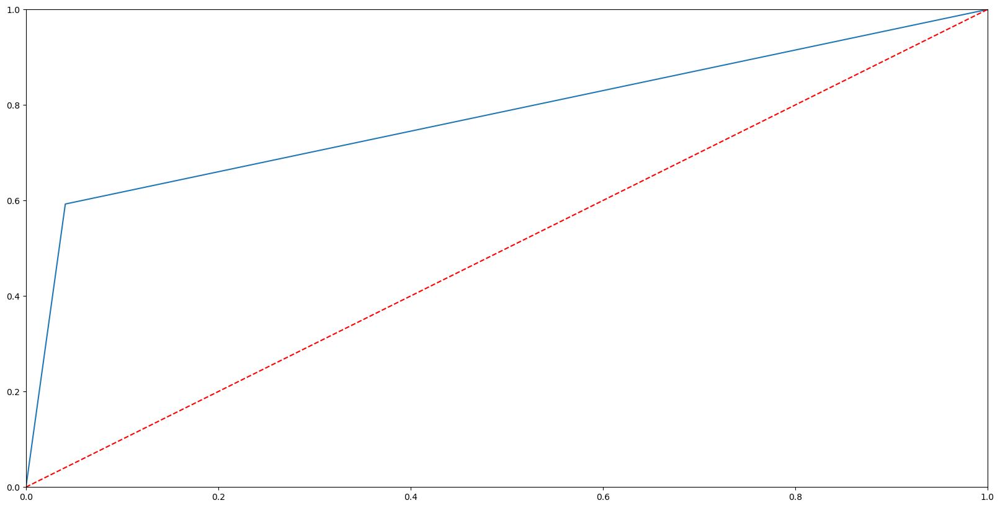

In [74]:
curve(ytest,lr_pred)

### 2.Decision Tree Classifier

In [75]:
dt = DecisionTreeClassifier(random_state=100)
dt.fit(xtrain_sc,ytrain)
dt_pred = dt.predict(xtest_sc)
dt_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [76]:
a2 = round(accuracy_score(ytest,dt_pred)*100,3)
a2

86.51

In [77]:
f2 = round(f1_score(ytest,dt_pred,average='weighted')*100,3)
f2

86.562

In [78]:
metrices('Decision Tree Classifier',ytest,dt_pred)

Name of the model : Decision Tree Classifier
Precision score : 0.5626072041166381
Recall score : 0.5734265734265734
Accuracy : 0.8650986753176534
F1-Score : 0.567965367965368
Weighted F1-Score 0.8656222163044986
Classification report 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92      3127
           1       0.56      0.57      0.57       572

    accuracy                           0.87      3699
   macro avg       0.74      0.75      0.74      3699
weighted avg       0.87      0.87      0.87      3699

Cohen Kappa Score : 0.4880444378740404


Area under the curve: 0.7459393820122953


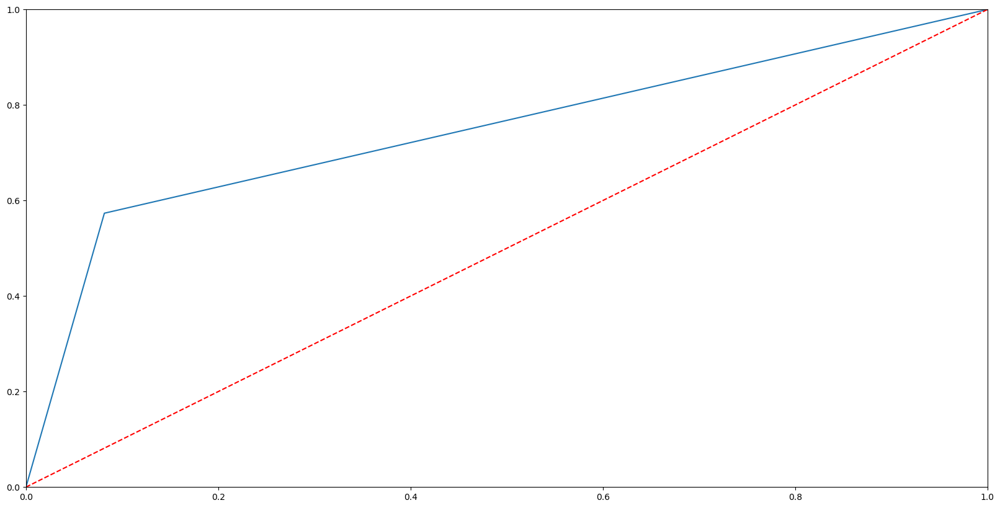

In [79]:
curve(ytest,dt_pred)

### 3.Random Forest Classifier:

In [80]:
rf = RandomForestClassifier(random_state=100)
rf.fit(xtrain_sc,ytrain)
rf_pred = rf.predict(xtest_sc)
rf_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [81]:
a3 = round(accuracy_score(ytest,rf_pred)*100,3)
a3

90.295

In [82]:
f3 = round(f1_score(ytest,rf_pred,average='weighted')*100,3)
f3

89.55

In [83]:
metrices('Random Forest classifier',ytest,rf_pred)

Name of the model : Random Forest classifier
Precision score : 0.7682619647355163
Recall score : 0.5332167832167832
Accuracy : 0.9029467423628007
F1-Score : 0.6295149638802889
Weighted F1-Score 0.8955038179212951
Classification report 
               precision    recall  f1-score   support

           0       0.92      0.97      0.94      3127
           1       0.77      0.53      0.63       572

    accuracy                           0.90      3699
   macro avg       0.84      0.75      0.79      3699
weighted avg       0.90      0.90      0.90      3699

Cohen Kappa Score : 0.5757597927008913


Area under the curve: 0.7518978063829359


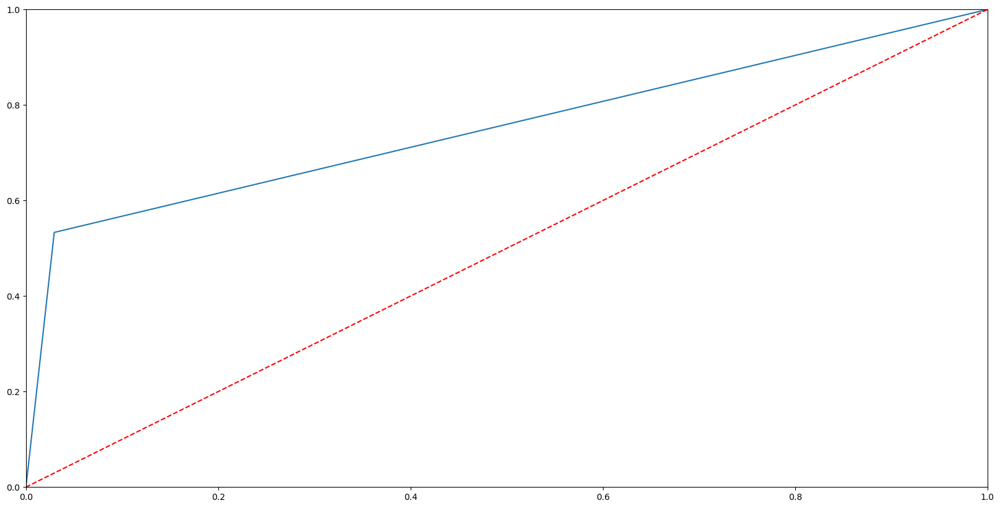

In [84]:
curve(ytest,rf_pred)

### 4.Tunned Random Forest Classifier 

    a. Selecting important features using Random Forest
    b. Using GridSearchCv

#### a.Selecting important features using Random Forest

In [85]:
## Using the feature_importance
rf = RandomForestClassifier()

rf.fit(xtrain_sc, ytrain)

# Calculate feature importances
importances = rf.feature_importances_
importances

fimp = pd.DataFrame(index=list(xtrain_sc.columns),data = list(importances),columns = ['Feature_importance'])
fimp.sort_values(by = 'Feature_importance',ascending = False).head(20)

,Feature_importance
PageValues,0.333559
ProductRelated_Duration,0.084739
ExitRates,0.083171
ProductRelated,0.073620
Administrative_Duration,0.054277
BounceRates,0.053819
Administrative,0.045381
Informational_Duration,0.027138
Month_Nov,0.019555
Informational,0.018659


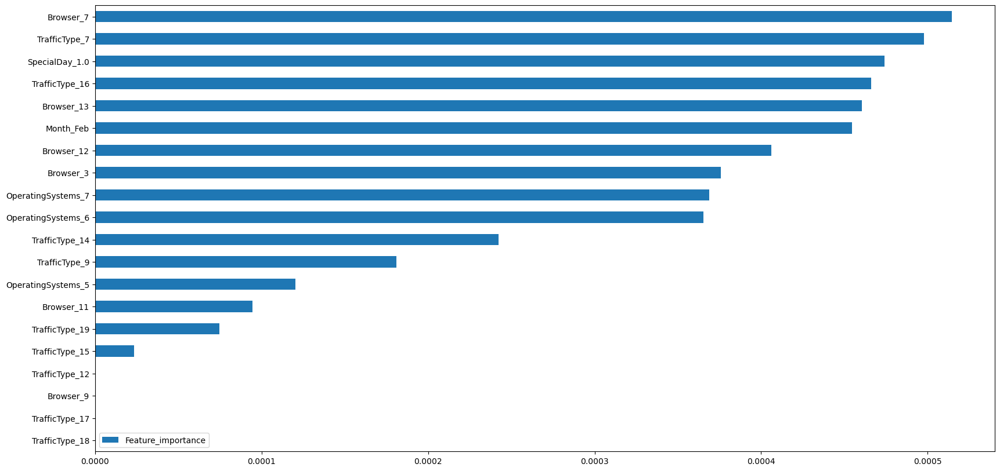

In [86]:
fimp.sort_values(by = 'Feature_importance',ascending = True).head(20).plot(kind='barh')
plt.show()

In [87]:
feat = fimp.sort_values(by = 'Feature_importance',ascending = False).head(20).index.to_list()
feat

['PageValues',
 'ProductRelated_Duration',
 'ExitRates',
 'ProductRelated',
 'Administrative_Duration',
 'BounceRates',
 'Administrative',
 'Informational_Duration',
 'Month_Nov',
 'Informational',
 'VisitorType_Returning_Visitor',
 'Weekend_True',
 'TrafficType_2',
 'Region_3',
 'Browser_2',
 'OperatingSystems_2',
 'Region_2',
 'Month_May',
 'Month_Dec',
 'OperatingSystems_3']

In [88]:
xtrain_feat = xtrain_sc[feat]
xtest_feat = xtest_sc[feat]

#### b.Using GridSearchCV

In [89]:
# Define the hyperparameter grid for GridSearchCV
param_grid = {'n_estimators': [100, 200, 300],           # Number of trees in the forest
    'max_depth': [5, 10, 20],                  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]}             # Minimum number of samples required to be at a leaf node


# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)


GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, 20],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [90]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [91]:
best_params

{'max_depth': 20,
 'min_samples_leaf': 4,
 'min_samples_split': 5,
 'n_estimators': 100}

In [92]:
best_model

RandomForestClassifier(max_depth=20, min_samples_leaf=4, min_samples_split=5)

In [93]:
rf_tunned = RandomForestClassifier(n_estimators = 300,max_depth=10, min_samples_leaf=2, min_samples_split=10,random_state=100)
rf.fit(xtrain_feat,ytrain)
rf_tunned_pred = rf.predict(xtest_feat)
rf_tunned_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [94]:
a4 = round(accuracy_score(ytest,rf_tunned_pred)*100,3)
a4

90.565

In [95]:
f4 = round(f1_score(ytest,rf_tunned_pred,average='weighted')*100,3)
f4

89.871

In [96]:
metrices('Tunned Random Forest classifier',ytest,rf_tunned_pred)

Name of the model : Tunned Random Forest classifier
Precision score : 0.7766749379652605
Recall score : 0.5472027972027972
Accuracy : 0.9056501757231684
F1-Score : 0.642051282051282
Weighted F1-Score 0.8987144427275979
Classification report 
               precision    recall  f1-score   support

           0       0.92      0.97      0.95      3127
           1       0.78      0.55      0.64       572

    accuracy                           0.91      3699
   macro avg       0.85      0.76      0.79      3699
weighted avg       0.90      0.91      0.90      3699

Cohen Kappa Score : 0.5895870694991214


Area under the curve: 0.759210608706931


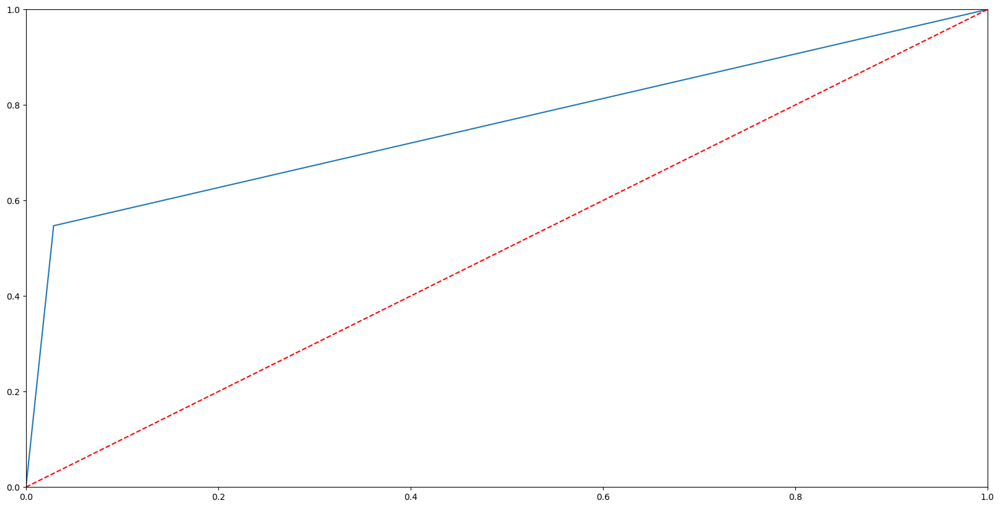

In [97]:
curve(ytest,rf_tunned_pred)

### 5.Naive - Bayes Classifier:

In [98]:
from sklearn.naive_bayes import GaussianNB

In [99]:
nb = GaussianNB()
nb.fit(xtrain_sc,ytrain)
nb_pred = nb.predict(xtest_sc)
nb_pred

array([0, 0, 1, ..., 1, 0, 1], dtype=int64)

In [100]:
metrices('Naive Bayes classifier',ytest,nb_pred)

Name of the model : Naive Bayes classifier
Precision score : 0.1717964824120603
Recall score : 0.9562937062937062
Accuracy : 0.28034603947012704
F1-Score : 0.2912673056443024
Weighted F1-Score 0.27251343451489746
Classification report 
               precision    recall  f1-score   support

           0       0.95      0.16      0.27      3127
           1       0.17      0.96      0.29       572

    accuracy                           0.28      3699
   macro avg       0.56      0.56      0.28      3699
weighted avg       0.83      0.28      0.27      3699

Cohen Kappa Score : 0.039431475020651696


Area under the curve: 0.5564967092389541


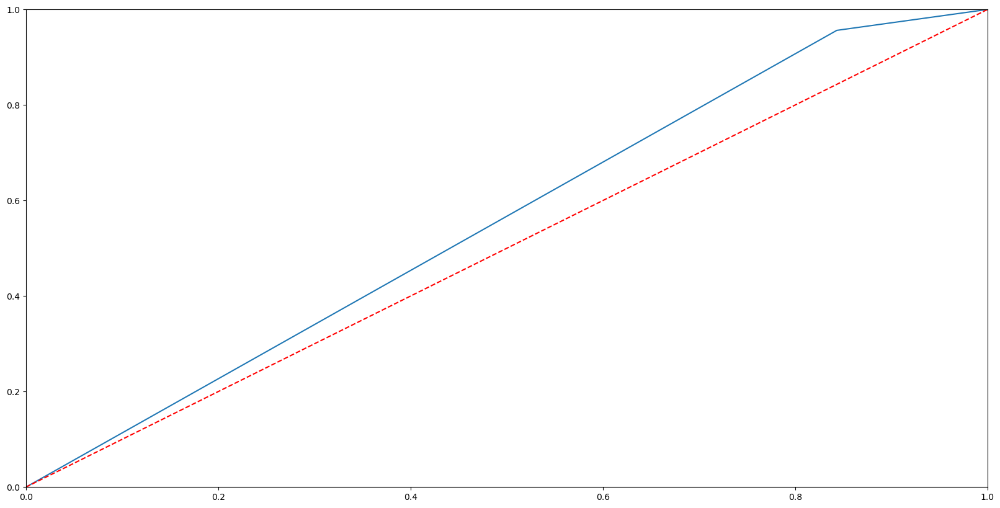

In [101]:
curve(ytest,nb_pred)

In [102]:
a5 = round(accuracy_score(ytest,nb_pred)*100,3)
a5

28.035

In [103]:
f5 = round(f1_score(ytest,nb_pred,average='weighted')*100,3)
f5

27.251

### 6.Support Vector Machine(classifier):

In [104]:
from sklearn.svm import SVC

In [105]:
svc = SVC(random_state=100)
svc.fit(xtrain_sc,ytrain)
svc_pred = svc.predict(xtest_sc)
svc_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [106]:
a6 = round(accuracy_score(ytest,svc_pred)*100,3)
a6

90.727

In [107]:
f6 = round(f1_score(ytest,svc_pred,average='weighted')*100,3)
f6

90.249

In [108]:
metrices('Support Vector classifier',ytest,svc_pred)

Name of the model : Support Vector classifier
Precision score : 0.756152125279642
Recall score : 0.5909090909090909
Accuracy : 0.907272235739389
F1-Score : 0.6633954857703631
Weighted F1-Score 0.9024933372057429
Classification report 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      3127
           1       0.76      0.59      0.66       572

    accuracy                           0.91      3699
   macro avg       0.84      0.78      0.80      3699
weighted avg       0.90      0.91      0.90      3699

Cohen Kappa Score : 0.6105614238317598


Area under the curve: 0.7780256999156903


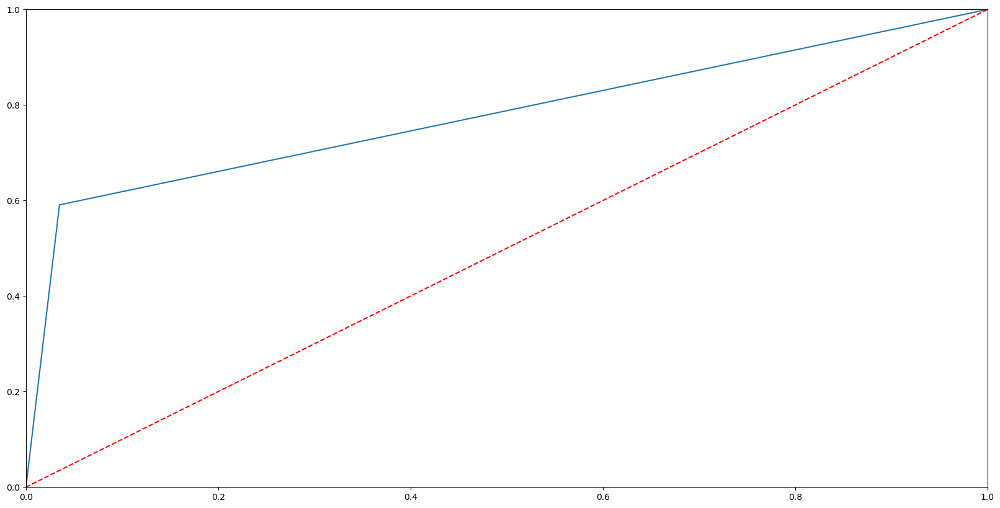

In [109]:
curve(ytest,svc_pred)

### 7.Gradiant Boosting Classifier:

In [110]:
gb = GradientBoostingClassifier(random_state=100)
gb.fit(xtrain_sc,ytrain)
gb_pred = gb.predict(xtest_sc)
gb_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [111]:
a7 = round(accuracy_score(ytest,gb_pred)*100,3)
a7

90.835

In [112]:
f7 = round(f1_score(ytest,gb_pred,average='weighted')*100,3)
f7

90.363

In [113]:
metrices('Gradiant Boosting classifier',ytest,gb_pred)

Name of the model : Gradiant Boosting classifier
Precision score : 0.7606263982102909
Recall score : 0.5944055944055944
Accuracy : 0.9083536090835361
F1-Score : 0.6673209028459274
Weighted F1-Score 0.9036304411450347
Classification report 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      3127
           1       0.76      0.59      0.67       572

    accuracy                           0.91      3699
   macro avg       0.84      0.78      0.81      3699
weighted avg       0.90      0.91      0.90      3699

Cohen Kappa Score : 0.6151029815713311


Area under the curve: 0.7800937469949302


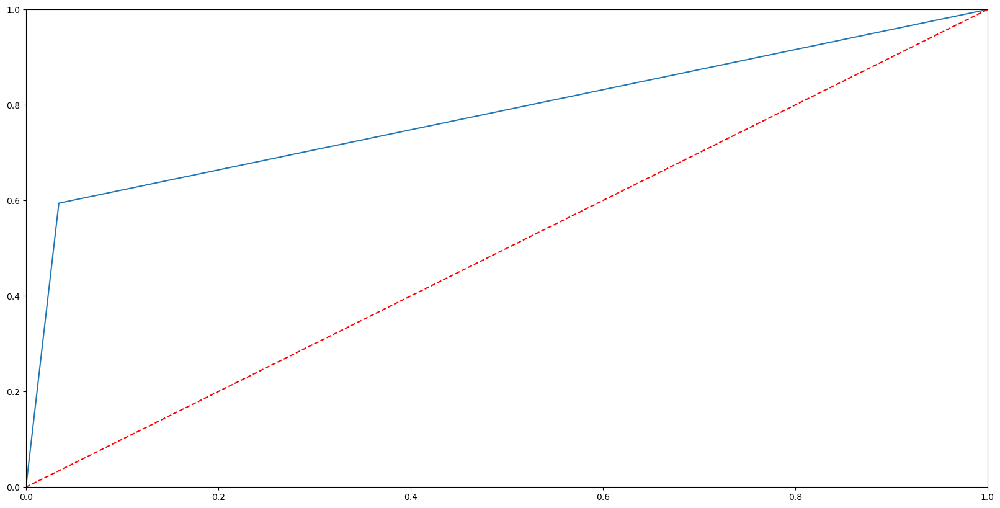

In [114]:
curve(ytest,gb_pred)

### 8. Ada Boosting Classifier:

In [115]:
ada = AdaBoostClassifier(random_state=100)
ada.fit(xtrain_sc,ytrain)
ada_pred = ada.predict(xtest_sc)
ada_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [116]:
a8 = round(accuracy_score(ytest,ada_pred)*100,3)
a8

89.376

In [117]:
f8 = round(f1_score(ytest,ada_pred,average='weighted')*100,3)
f8

88.838

In [118]:
metrices('Ada Boosting classifier',ytest,ada_pred)

Name of the model : Ada Boosting classifier
Precision score : 0.6993318485523385
Recall score : 0.548951048951049
Accuracy : 0.8937550689375506
F1-Score : 0.6150832517140059
Weighted F1-Score 0.8883800283983481
Classification report 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      3127
           1       0.70      0.55      0.62       572

    accuracy                           0.89      3699
   macro avg       0.81      0.75      0.78      3699
weighted avg       0.89      0.89      0.89      3699

Cohen Kappa Score : 0.5544907283828524


Area under the curve: 0.7528893396338231


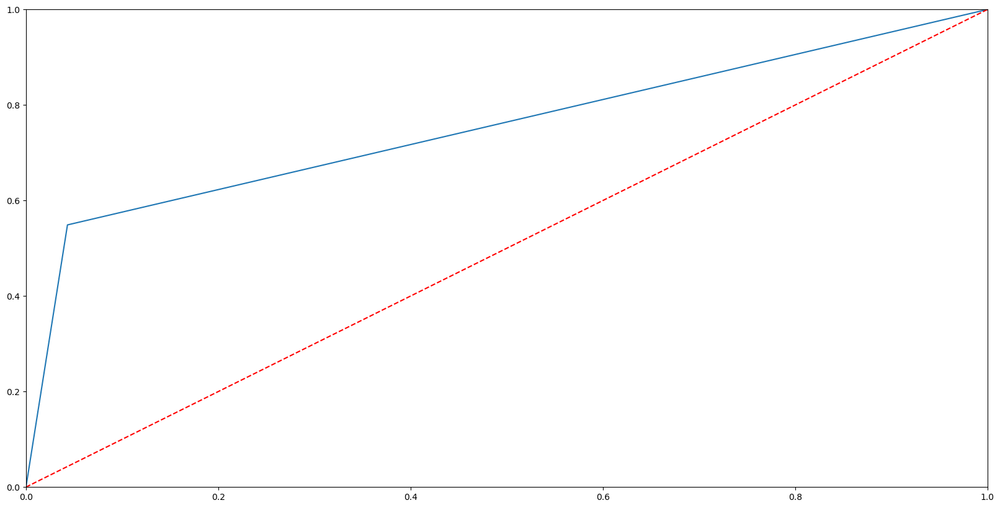

In [119]:
curve(ytest,ada_pred)

### 9.XG Boost Classifier:

In [120]:
xg = XGBClassifier(random_state=100)
xg.fit(xtrain_sc,ytrain)
xg_pred = xg.predict(xtest_sc)
xg_pred

array([0, 0, 0, ..., 0, 0, 0])

In [121]:
a9 = round(accuracy_score(ytest,xg_pred)*100,3)
a9

89.808

In [122]:
f9 = round(f1_score(ytest,xg_pred,average='weighted')*100,3)
f9

89.359

In [123]:
metrices('XG Boosting classifier',ytest,xg_pred)

Name of the model : XG Boosting classifier
Precision score : 0.7105831533477321
Recall score : 0.5751748251748252
Accuracy : 0.8980805623141389
F1-Score : 0.6357487922705314
Weighted F1-Score 0.8935867444711793
Classification report 
               precision    recall  f1-score   support

           0       0.92      0.96      0.94      3127
           1       0.71      0.58      0.64       572

    accuracy                           0.90      3699
   macro avg       0.82      0.77      0.79      3699
weighted avg       0.89      0.90      0.89      3699

Cohen Kappa Score : 0.5772626533401762


Area under the curve: 0.7661611254112054


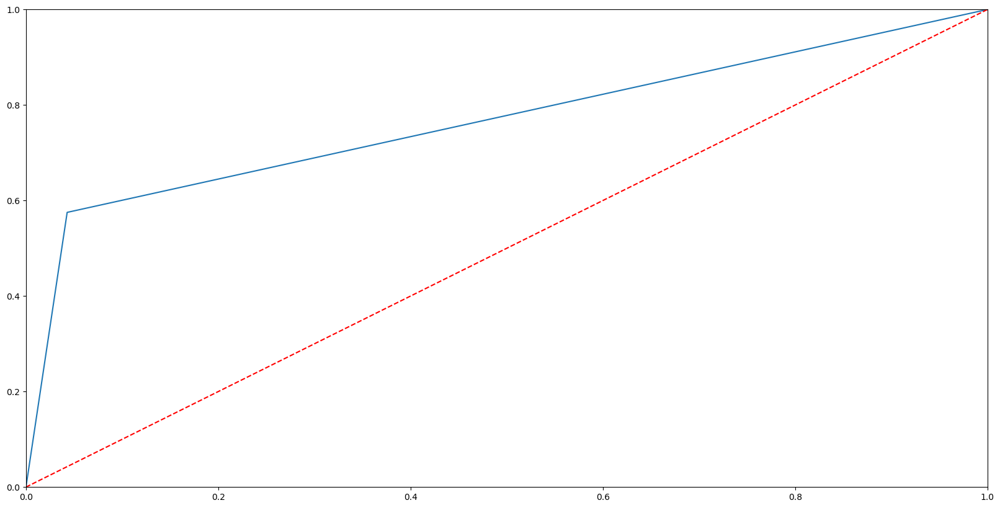

In [124]:
curve(ytest,xg_pred)

### 10. Tunned Gradient Boosting Classifier:

In [125]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],            # Step size shrinkage used to prevent overfitting
    'n_estimators': [50, 100, 150],                 # Number of boosting stages to be run
    'max_depth': [3, 5, 7]                         # Maximum depth of the individual trees
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, cv=3, scoring='accuracy')


# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=100),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [126]:
# Get the best hyperparameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [127]:
best_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}

In [128]:
best_model

GradientBoostingClassifier(n_estimators=50, random_state=100)

In [129]:
gb1 = GradientBoostingClassifier(n_estimators=150,learning_rate = 0.01, max_depth = 5, random_state=100)
gb1.fit(xtrain_feat,ytrain)
gb_pred1 = gb1.predict(xtest_feat)
gb_pred1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [130]:
a10 = round(accuracy_score(ytest,gb_pred1)*100,3)
a10

90.538

In [131]:
f10 = round(f1_score(ytest,gb_pred1,average='weighted')*100,3)
f10

89.606

In [132]:
metrices('Tunned Gradient Boosting classifier',ytest,gb_pred1)

Name of the model : Tunned Gradient Boosting classifier
Precision score : 0.8100558659217877
Recall score : 0.506993006993007
Accuracy : 0.9053798323871317
F1-Score : 0.6236559139784946
Weighted F1-Score 0.8960587256246936
Classification report 
               precision    recall  f1-score   support

           0       0.92      0.98      0.95      3127
           1       0.81      0.51      0.62       572

    accuracy                           0.91      3699
   macro avg       0.86      0.74      0.78      3699
weighted avg       0.90      0.91      0.90      3699

Cohen Kappa Score : 0.5727958058655318


Area under the curve: 0.7426234622429059


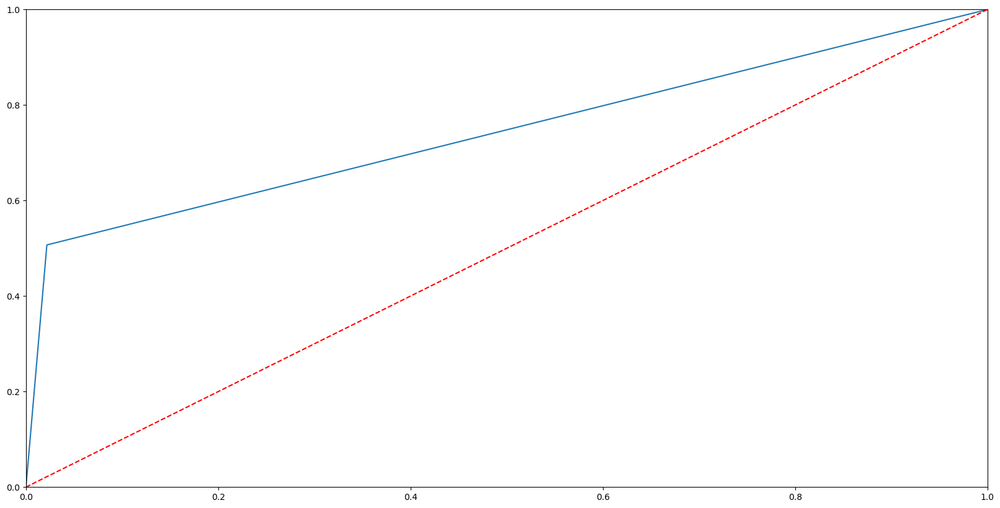

In [133]:
curve(ytest,gb_pred1)

### 11. Tunned Ada Boosting Classifier:

#### Using GridSearchCV

In [134]:
param_grid = {
    'n_estimators': [50, 100, 150],           # Number of weak learners (base estimators)
    'learning_rate': [0.1, 0.5, 1.0]}        # Weight of each weak learner's contribution


# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=ada, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)

GridSearchCV(cv=3, estimator=AdaBoostClassifier(random_state=100),
             param_grid={'learning_rate': [0.1, 0.5, 1.0],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [135]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [136]:
best_params

{'learning_rate': 0.1, 'n_estimators': 100}

In [137]:
best_model

AdaBoostClassifier(learning_rate=0.1, n_estimators=100, random_state=100)

In [138]:
ada1 = AdaBoostClassifier(learning_rate=0.1, n_estimators=100, random_state=100)
ada1.fit(xtrain_feat,ytrain)
ada_pred1 = ada1.predict(xtest_feat)
ada_pred1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [139]:
a11 = round(accuracy_score(ytest,ada_pred1)*100,3)
a11

90.024

In [140]:
f11 = round(f1_score(ytest,ada_pred1,average='weighted')*100,3)
f11

89.548

In [141]:
metrices('Ada Boosting classifier with important features',ytest,ada_pred1)

Name of the model : Ada Boosting classifier with important features
Precision score : 0.7230769230769231
Recall score : 0.5751748251748252
Accuracy : 0.9002433090024331
F1-Score : 0.640701071080818
Weighted F1-Score 0.8954769549235084
Classification report 
               precision    recall  f1-score   support

           0       0.93      0.96      0.94      3127
           1       0.72      0.58      0.64       572

    accuracy                           0.90      3699
   macro avg       0.82      0.77      0.79      3699
weighted avg       0.89      0.90      0.90      3699

Cohen Kappa Score : 0.5836534381745956


Area under the curve: 0.7674403067351581


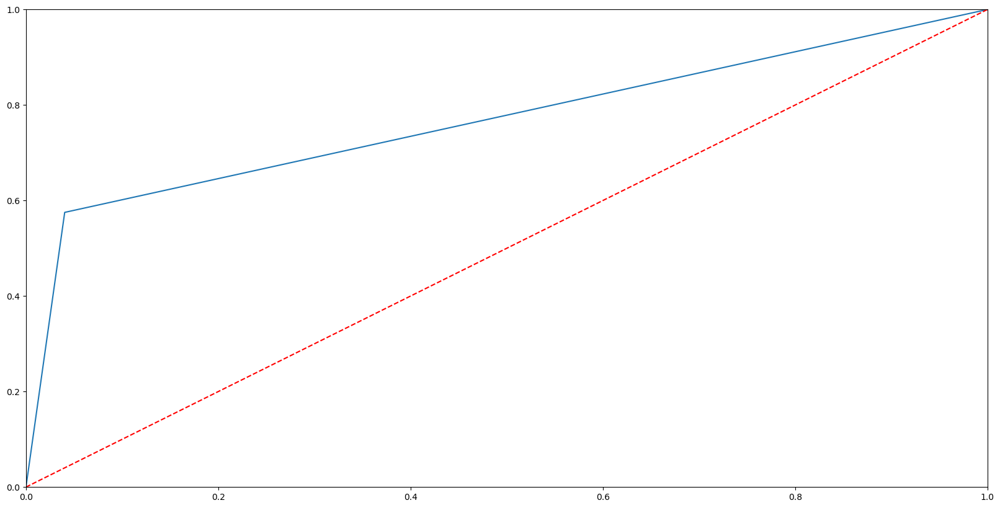

In [142]:
curve(ytest,ada_pred1)

### 12.Tunned XG Boosting Classifier

In [143]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],              # Step size shrinkage used to prevent overfitting
    'n_estimators': [50, 100, 150],                   # Number of boosting rounds
    'max_depth': [3, 5, 7],                           # Maximum depth of the trees
                        }

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=xg, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=100, ...),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [144]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [145]:
best_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}

In [146]:
best_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=100, ...)

In [147]:
xg1 = XGBClassifier(learning_rate = 0.1,max_depth=3, n_estimators = 50,random_state=100)
xg1.fit(xtrain_feat,ytrain)
xg_pred1 = xg1.predict(xtest_feat)
xg_pred1

array([0, 0, 0, ..., 0, 0, 0])

In [148]:
a12 = round(accuracy_score(ytest,xg_pred1)*100,3)
a12

90.781

In [149]:
f12 = round(f1_score(ytest,xg_pred1,average='weighted')*100,3)
f12

90.297

In [150]:
metrices('Tunned XG Boosting classifier',ytest,xg_pred1)

Name of the model : Tunned XG Boosting classifier
Precision score : 0.7595505617977528
Recall score : 0.5909090909090909
Accuracy : 0.9078129224114626
F1-Score : 0.6647000983284169
Weighted F1-Score 0.9029742876115021
Classification report 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      3127
           1       0.76      0.59      0.66       572

    accuracy                           0.91      3699
   macro avg       0.84      0.78      0.81      3699
weighted avg       0.90      0.91      0.90      3699

Cohen Kappa Score : 0.6122239803640122


Area under the curve: 0.7783454952466784


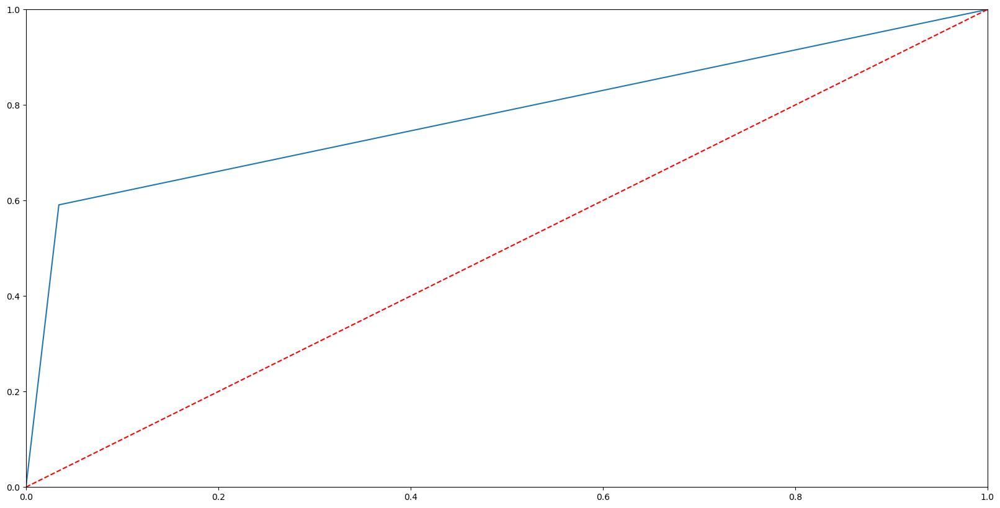

In [151]:
curve(ytest,xg_pred1)

# Summary

In [152]:
data = {'Models':['Logistic Regression','Decision tree Classifier',
                  'Random Forest Classifier','Tunned Random Forest Classifier',
                    'Naive - Bayes Classifier','Support Vector Machine(classifier)',
                    'Gradient Boosting Classifier','XG Boosting Classifier',
                  'Ada Boosting Classifier','Tunned Gradient Boosting Classifier',
                'Tunned Ada Boosting Classifier','Tunned XG Boosting Classifier'],
        'Accuracy':[a1,a2,a3,a4,a5,a6,a7,a8,a9,a10,a11,a12],
         'Weighted F1_score':[f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12]}

In [153]:
result = pd.DataFrame(data).sort_values(by = ['Accuracy','Weighted F1_score'],ascending=False)

In [154]:
result

,Models,Accuracy,Weighted F1_score
6,Gradient Boosting Classifier,90.835,90.363
11,Tunned XG Boosting Classifier,90.781,90.297
5,Support Vector Machine(classifier),90.727,90.249
3,Tunned Random Forest Classifier,90.565,89.871
9,Tunned Gradient Boosting Classifier,90.538,89.606
2,Random Forest Classifier,90.295,89.550
0,Logistic Regression,90.241,89.828
10,Tunned Ada Boosting Classifier,90.024,89.548
8,Ada Boosting Classifier,89.808,89.359
7,XG Boosting Classifier,89.376,88.838


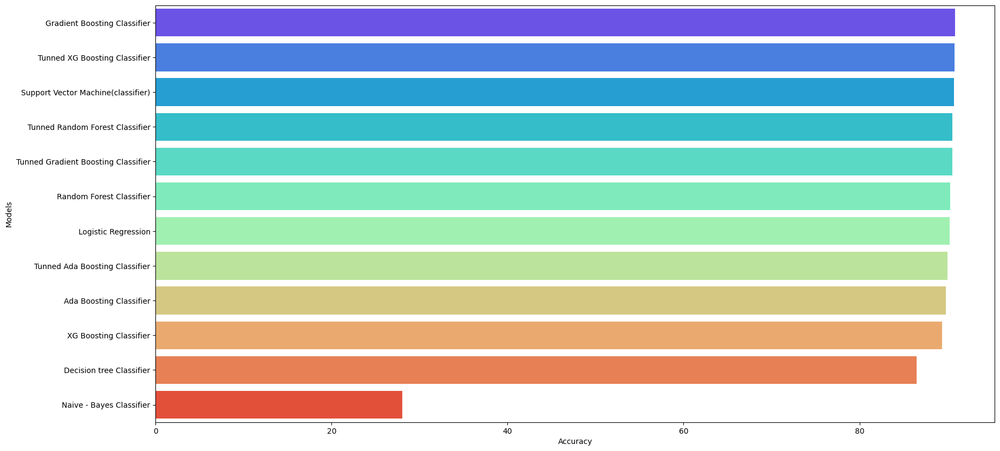

In [155]:
sns.barplot(x=result['Accuracy'],y=result['Models'],palette='rainbow')
plt.show()

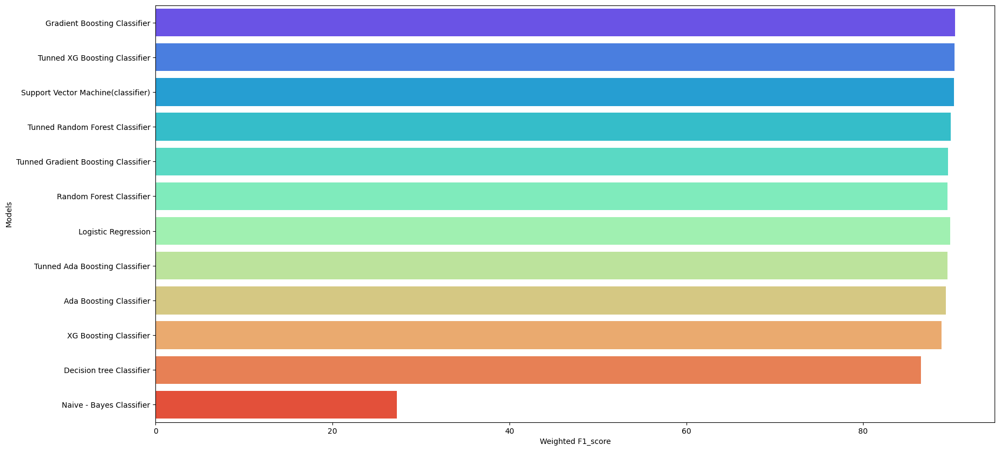

In [156]:
sns.barplot(x=result['Weighted F1_score'],y=result['Models'],palette='rainbow')
plt.show()

Based on the analysis of the data set using the Gradient Boosting model, the following conclusions can be drawn:


1. **High Accuracy**: The Gradient Boosting model achieved a high accuracy of 90.4%. This means that the model is making correct predictions for approximately 90.4% of the instances in the dataset. This high accuracy indicates that the model is performing well in classifying the data into the correct classes.

2. **Balanced F1 Score(weighted)**: The weighted F1 score of 90% suggests that the model is reasonably good at maintaining a balance between precision and recall. The weighted F1 score takes into account class imbalances, and a value of 90% implies that the model is effectively identifying both positive and negative instances.Since the accuracy and F1-score are not exactly the same, it suggests that the dataset might be imbalanced, meaning one class has significantly more instances than the other. The model might be performing better on the majority class (higher accuracy) while not as well on the minority class (lower F1-score). In such cases, further investigation and possible handling of class imbalance might be required.

4. **Model Selection**: The results indicate that Gradient Boosting is a good choice for this dataset as it achieves high accuracy and a reasonable F1-score. However, it's essential to compare these results with other models 
* Tunned XG Boosting Classifier	  ----------      Acurracy - 90.376 ---	weighted f1 score - 90.027
* Random Forest Classifier	      ----------      Acurracy - 90.214 ---	weighted f1 score - 89.555
* Support Vector Machine(classifier)  ----------              Acurracy - 90.187	--- weighted f1 score - 89.942
  
  to determine if Gradient Boosting is indeed the best model for this specific problem.

5. **Hyperparameter Tuning**: The model might have the potential to further improve its performance by fine-tuning hyperparameters. The GridSearchCV process used for hyperparameter tuning can be revisited to search for more optimal hyperparameters and potentially improve both accuracy and the weighted F1-score.

6. **Business Impact**: Finally, consider the business implications of the model's performance. Depending on the specific application, accuracy and weighted F1-score might have different levels of importance. Consider the cost of false positives and false negatives and how the model's predictions align with the business objectives.

In conclusion, achieving an accuracy of 90.4% and weighted F1-score of 90% is a promising result, but further analysis, model evaluation, and business context are essential to draw comprehensive conclusions and make informed decisions. 

# Model Building with Balanced Target variable:

##### Evaluation metrices taken into account

**1.Accuracy 2.Weighted F1-score**


### Balancing the target using Under sampling 

In [157]:
x

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay_0.2,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
0,-0.990128,-0.996659,-0.520489,-0.491697,-1.922123,-2.096783,2.206432,1.982547,-0.529409,0,...,0,0,0,0,0,0,0,0,1,0
1,-0.990128,-0.996659,-0.520489,-0.491697,-1.574524,-1.074189,-0.799209,1.569866,-0.529409,0,...,0,0,0,0,0,0,0,0,1,0
2,-0.990128,-0.996659,-0.520489,-0.491697,-1.922123,-2.096783,2.206432,1.982547,-0.529409,0,...,0,0,0,0,0,0,0,0,1,0
3,-0.990128,-0.996659,-0.520489,-0.491697,-1.574524,-1.875436,1.709303,1.832073,-0.529409,0,...,0,0,0,0,0,0,0,0,1,0
4,-0.990128,-0.996659,-0.520489,-0.491697,-0.442610,0.057515,0.756734,0.722460,-0.529409,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,0.848665,1.126581,-0.520489,-0.491697,0.981805,0.811465,-0.106534,-0.009450,1.930441,0,...,0,0,0,0,0,0,0,0,1,1
12326,-0.990128,-0.996659,-0.520489,-0.491697,-0.974115,-0.126425,-0.799209,-0.374701,-0.529409,0,...,0,0,0,0,0,0,0,0,1,1
12327,-0.990128,-0.996659,-0.520489,-0.491697,-0.839519,-0.623972,2.051336,1.422627,-0.529409,0,...,0,0,0,0,0,0,0,0,1,1
12328,1.040186,0.907532,-0.520489,-0.491697,-0.111001,-0.297654,-0.799209,-0.389234,-0.529409,0,...,0,0,0,0,0,0,0,0,1,0


In [158]:
y

0        0
1        0
2        0
3        0
4        0
        ..
12325    0
12326    0
12327    0
12328    0
12329    0
Name: Purchase, Length: 12330, dtype: int64

In [159]:
import numpy as np
from imblearn.under_sampling import RandomUnderSampler



# Initialize the RandomUnderSampler object with the desired sampling strategy
undersampler = RandomUnderSampler(sampling_strategy=0.3)  # Undersample to 30% of the majority class

# Fit and transform the data to perform undersampling
x_undersampled, y_undersampled = undersampler.fit_resample(x, y)

# Check the class distribution in the undersampled dataset
print("Undersampled class distribution:")
print(np.bincount(y_undersampled))


Undersampled class distribution:
[6360 1908]


In [160]:
y_undersampled.value_counts(normalize=True)

0    0.769231
1    0.230769
Name: Purchase, dtype: float64

In [161]:
xtrain,xtest,ytrain,ytest = train_test_split(x_undersampled, y_undersampled,test_size=0.3,random_state=100)

In [162]:
print('x train',xtrain.shape)
print('x test',xtest.shape)
print('y train',ytrain.shape)
print('y test',ytest.shape)

x train (5787, 72)
x test (2481, 72)
y train (5787,)
y test (2481,)


# Scaling

* We want to split the data as train and test and then do scaling
* Apply .fit_transform() in train data on doings scaling
* Apply .transform() in test data on doings scaling

In [163]:
xtrain_sc = xtrain.copy()
xtest_sc = xtest.copy()

In [164]:
num

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues']

In [165]:
s = StandardScaler()

xtrain_sc[num] = s.fit_transform(xtrain[num])
xtest_sc[num] = s.transform(xtest[num])

In [166]:
xtrain_sc

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay_0.2,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
8286,-1.009547,-1.018791,-0.544035,-0.514126,1.162162,0.739337,0.290320,-0.221269,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
3439,1.577345,0.973294,-0.544035,-0.514126,1.685476,1.905689,0.404577,0.068767,-0.609715,1,...,0,0,0,0,0,0,0,0,1,0
7024,0.066458,0.541355,-0.544035,-0.514126,1.135686,0.559593,0.629926,0.322619,1.689730,0,...,0,0,0,0,0,0,0,0,1,1
7440,0.066458,0.364760,-0.544035,-0.514126,-2.501878,-2.089267,-0.782563,1.136988,-0.609715,0,...,0,0,0,0,0,0,0,0,0,0
1469,-1.009547,-1.018791,-0.544035,-0.514126,-0.462786,-0.673902,0.146941,0.556425,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9656,1.258604,1.294753,-0.544035,-0.514126,-0.317266,-0.328740,-0.782563,-1.196247,-0.609715,0,...,0,0,0,0,0,0,0,0,0,0
8874,1.765069,1.223250,1.913334,1.997775,1.237293,1.371597,0.774136,-0.652294,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
11165,0.539061,0.701990,-0.544035,-0.514126,0.673783,0.863415,-0.782563,-0.840193,1.720674,0,...,0,0,0,0,0,0,0,0,1,0
5514,0.066458,0.668246,-0.544035,-0.514126,0.447182,-0.045773,0.076102,0.652303,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0


In [167]:
xtest_sc

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay_0.2,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_Other,VisitorType_Returning_Visitor,Weekend_True
2831,-1.009547,-1.018791,-0.544035,-0.514126,0.183201,-0.154510,-0.782563,-0.955681,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
1913,1.258604,1.132731,1.918429,1.996024,-0.135753,0.063345,-0.084060,-1.368803,-0.609715,0,...,0,0,0,0,0,0,0,0,0,0
9576,1.346000,1.577145,1.913334,1.997959,2.614386,2.654674,-0.253279,-0.645908,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
9865,0.066458,-0.212270,-0.544035,-0.514126,0.183201,0.750854,-0.782563,-0.688119,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
3367,-1.009547,-1.018791,-0.544035,-0.514126,-1.921885,-2.089267,2.248366,2.006945,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,-1.009547,-1.018791,-0.544035,-0.514126,-1.143457,-1.127132,2.160732,1.895697,-0.609715,0,...,0,0,0,0,0,0,0,0,1,1
8745,-1.009547,-1.018791,-0.544035,-0.514126,0.183201,-0.500525,0.076102,0.689158,-0.609715,0,...,0,0,0,0,0,0,0,0,1,1
922,-1.009547,-1.018791,-0.544035,-0.514126,-1.921885,-2.089267,2.248366,2.006945,-0.609715,0,...,0,0,0,0,0,0,0,0,1,0
9366,1.009769,0.753745,-0.544035,-0.514126,0.717282,0.976282,-0.209172,-0.636985,-0.609715,0,...,0,0,0,0,0,0,0,0,1,1


In [168]:
#### User define function for metrices

def metrices(name,key,arg):
    print('Name of the model :',name)
    print('Precision score :',precision_score(key,arg))    
    print('Recall score :',recall_score(key,arg)) 
    print('Accuracy :', accuracy_score(key,arg))
    print('F1-Score :', f1_score(key,arg))
    print('Weighted F1-Score', f1_score(key,arg,average='weighted'))
    print('Classification report','\n',classification_report(key,arg))
    print('Cohen Kappa Score :', cohen_kappa_score(key,arg))

In [169]:
#### User define function for Roc-Auc curve

def curve(key,arg):
    fpr,tpr,threshold = roc_curve(key,arg)
    plt.plot(fpr,tpr)
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([0.0 ,1.0])
    plt.ylim([0.0 , 1.0])
    print('Area under the curve:',roc_auc_score(key,arg))
    

#### Building the top 5 models obtainted from the above observation

* Gradient Boosting Classifier
* Support Vector Machine(classifier)
* Tunned XG Boosting Classifier
* Tunned Gradient Boosting Classifier
* Tunned Random Forest Classifier

### 1.Gradient Boosting Classifier

In [170]:
gb = GradientBoostingClassifier(random_state=100)
gb.fit(xtrain_sc,ytrain)
gb_pred = gb.predict(xtest_sc)
gb_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [171]:
a1 = round(accuracy_score(ytest,gb_pred)*100,3)
a1

88.11

In [172]:
f1 = round(f1_score(ytest,gb_pred,average='weighted')*100,3)
f1

87.934

In [173]:
metrices('Gradient Boosting Regression',ytest,gb_pred)

Name of the model : Gradient Boosting Regression
Precision score : 0.7699443413729128
Recall score : 0.7081911262798635
Accuracy : 0.8810963321241435
F1-Score : 0.7377777777777778
Weighted F1-Score 0.8793408012264945
Classification report 
               precision    recall  f1-score   support

           0       0.91      0.93      0.92      1895
           1       0.77      0.71      0.74       586

    accuracy                           0.88      2481
   macro avg       0.84      0.82      0.83      2481
weighted avg       0.88      0.88      0.88      2481

Cohen Kappa Score : 0.6610682420301406


Area under the curve: 0.8213778850396679


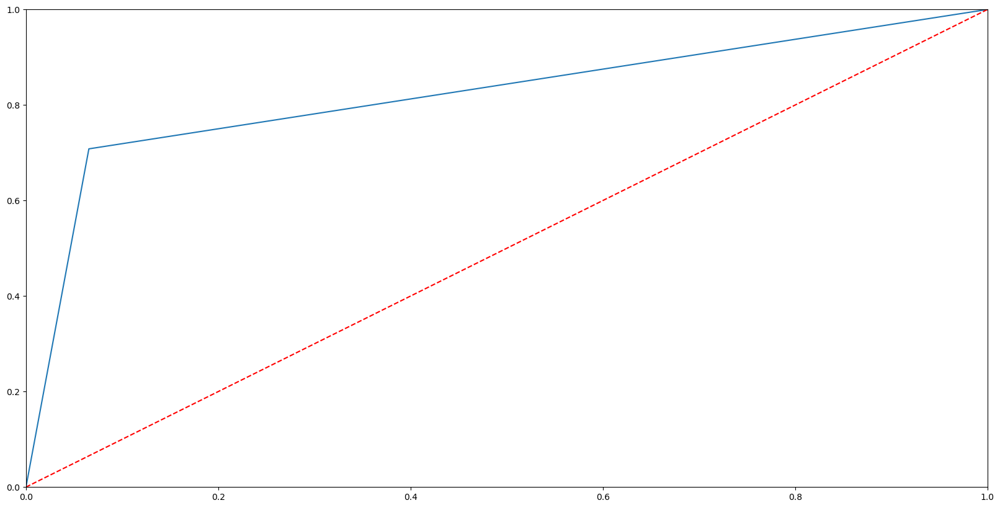

In [174]:
curve(ytest,gb_pred)

### 2.Support Vector Machine(classifier):

In [175]:
svc = SVC(random_state=100)
svc.fit(xtrain_sc,ytrain)
svc_pred = svc.predict(xtest_sc)
svc_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [176]:
metrices('Support Vector classifier',ytest,svc_pred)

Name of the model : Support Vector classifier
Precision score : 0.7428571428571429
Recall score : 0.7098976109215017
Accuracy : 0.8734381297863765
F1-Score : 0.7260034904013963
Weighted F1-Score 0.872433596079875
Classification report 
               precision    recall  f1-score   support

           0       0.91      0.92      0.92      1895
           1       0.74      0.71      0.73       586

    accuracy                           0.87      2481
   macro avg       0.83      0.82      0.82      2481
weighted avg       0.87      0.87      0.87      2481

Cohen Kappa Score : 0.6437734406508555


Area under the curve: 0.8169540825056056


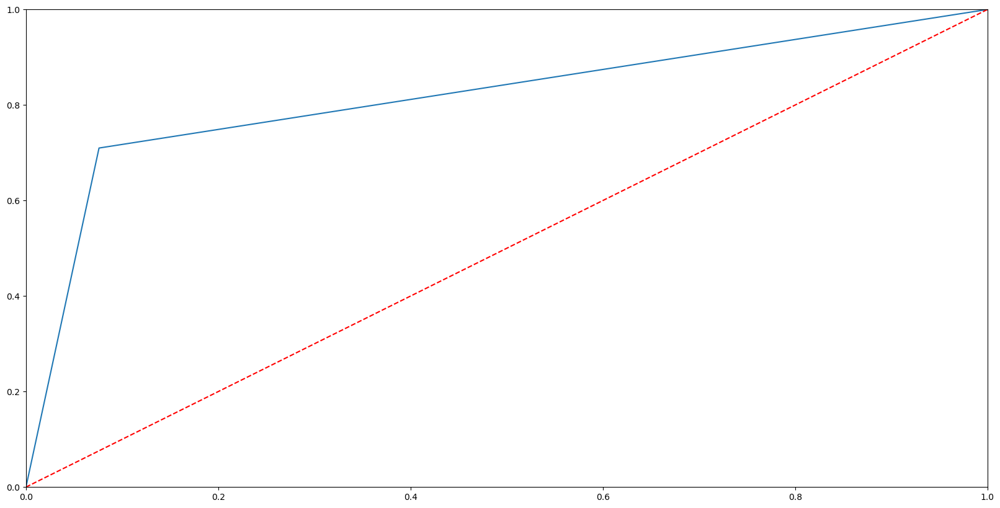

In [177]:
curve(ytest,svc_pred)

In [178]:
a2 = round(accuracy_score(ytest,svc_pred)*100,3)
a2

87.344

In [179]:
f2 = round(f1_score(ytest,svc_pred,average='weighted')*100,3)
f2

87.243

### 3.Tunned Random Forest Classifier 

    a. Selecting important features using Random Forest
    b. Using GridSearchCv

#### a.Selecting important features using Random Forest

In [180]:
## Using the feature_importance
rf = RandomForestClassifier()

rf.fit(xtrain_sc, ytrain)

# Calculate feature importances
importances = rf.feature_importances_
importances

fimp = pd.DataFrame(index=list(xtrain_sc.columns),data = list(importances),columns = ['Feature_importance'])
fimp.sort_values(by = 'Feature_importance',ascending = False).head(20)

,Feature_importance
PageValues,0.350253
ExitRates,0.082958
ProductRelated_Duration,0.077926
ProductRelated,0.068986
BounceRates,0.053318
Administrative_Duration,0.053214
Administrative,0.043613
Informational_Duration,0.027381
Month_Nov,0.023119
Informational,0.018620


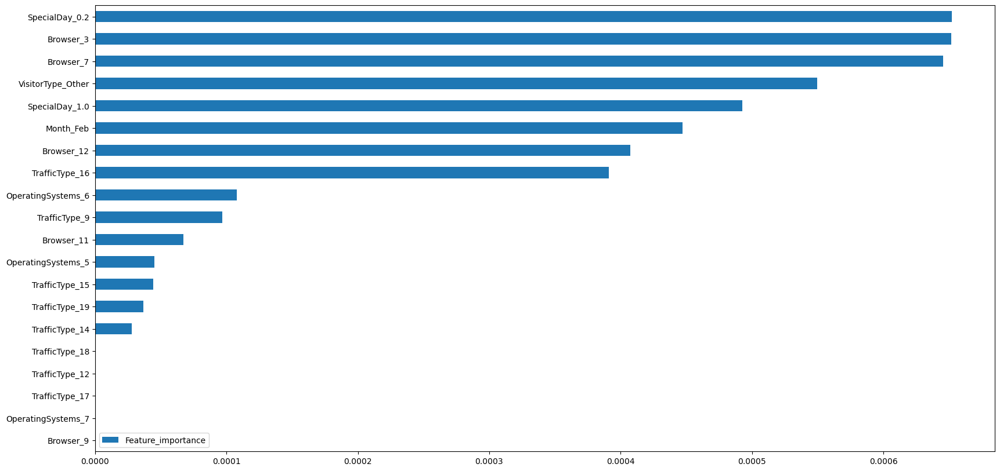

In [181]:
fimp.sort_values(by = 'Feature_importance',ascending = True).head(20).plot(kind='barh')
plt.show()

In [182]:
feat = fimp.sort_values(by = 'Feature_importance',ascending = False).head(20).index.to_list()
feat

['PageValues',
 'ExitRates',
 'ProductRelated_Duration',
 'ProductRelated',
 'BounceRates',
 'Administrative_Duration',
 'Administrative',
 'Informational_Duration',
 'Month_Nov',
 'Informational',
 'VisitorType_Returning_Visitor',
 'TrafficType_2',
 'Weekend_True',
 'Browser_2',
 'OperatingSystems_2',
 'Region_3',
 'Month_May',
 'OperatingSystems_3',
 'Region_2',
 'Region_4']

In [183]:
xtrain_feat = xtrain_sc[feat]
xtest_feat = xtest_sc[feat]

##### B.Using GridSearchCv

In [184]:
# Define the hyperparameter grid for GridSearchCV
param_grid = {'n_estimators': [100, 200, 300],           # Number of trees in the forest
    'max_depth': [5, 10, 20],                  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]}             # Minimum number of samples required to be at a leaf node


# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, 20],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [185]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [186]:
best_params

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 300}

In [187]:
best_model

RandomForestClassifier(max_depth=10, n_estimators=300)

In [188]:
rf_tunned = RandomForestClassifier(n_estimators = 300,max_depth=20, min_samples_leaf=4, min_samples_split=10,random_state=100)
rf.fit(xtrain_feat,ytrain)
rf_tunned_pred = rf.predict(xtest_feat)
rf_tunned_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [189]:
a3 = round(accuracy_score(ytest,rf_tunned_pred)*100,3)
a3

86.9

In [190]:
f3 = round(f1_score(ytest,rf_tunned_pred,average='weighted')*100,3)
f3

86.542

In [191]:
metrices('Tunned Random Forest classifier',ytest,rf_tunned_pred)

Name of the model : Tunned Random Forest classifier
Precision score : 0.7594433399602386
Recall score : 0.6518771331058021
Accuracy : 0.8690044336960903
F1-Score : 0.7015610651974289
Weighted F1-Score 0.8654160527032193
Classification report 
               precision    recall  f1-score   support

           0       0.90      0.94      0.92      1895
           1       0.76      0.65      0.70       586

    accuracy                           0.87      2481
   macro avg       0.83      0.79      0.81      2481
weighted avg       0.86      0.87      0.87      2481

Cohen Kappa Score : 0.6182702873133604


Area under the curve: 0.7940124451808694


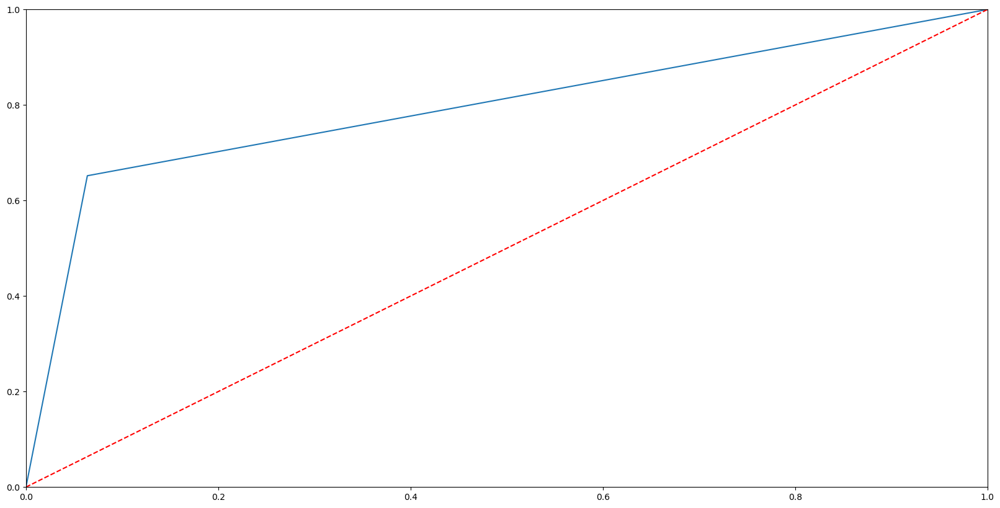

In [192]:
curve(ytest,rf_tunned_pred)

### 4.Tunned XG Boosting Classifier

In [193]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],              # Step size shrinkage used to prevent overfitting
    'n_estimators': [50, 100, 150],                   # Number of boosting rounds
    'max_depth': [3, 5, 7],                           # Maximum depth of the trees
                        }

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=xg, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=100, ...),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [194]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [195]:
best_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}

In [196]:
best_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=100, ...)

In [197]:
xg1 = XGBClassifier(learning_rate = 0.1,max_depth=5, n_estimators = 50,random_state=100)
xg1.fit(xtrain_feat,ytrain)
xg_pred1 = xg1.predict(xtest_feat)
xg_pred1

array([0, 0, 0, ..., 0, 0, 0])

In [198]:
a4 = round(accuracy_score(ytest,xg_pred1)*100,3)
a4

87.465

In [199]:
f4 = round(f1_score(ytest,xg_pred1,average='weighted')*100,3)
f4

87.211

In [200]:
metrices('Tunned XG Boosting classifier',ytest,xg_pred1)

Name of the model : Tunned XG Boosting classifier
Precision score : 0.762906309751434
Recall score : 0.6808873720136519
Accuracy : 0.8746473196291817
F1-Score : 0.7195671776375113
Weighted F1-Score 0.8721116204479008
Classification report 
               precision    recall  f1-score   support

           0       0.90      0.93      0.92      1895
           1       0.76      0.68      0.72       586

    accuracy                           0.87      2481
   macro avg       0.83      0.81      0.82      2481
weighted avg       0.87      0.87      0.87      2481

Cohen Kappa Score : 0.6391859986074175


Area under the curve: 0.8077260079065621


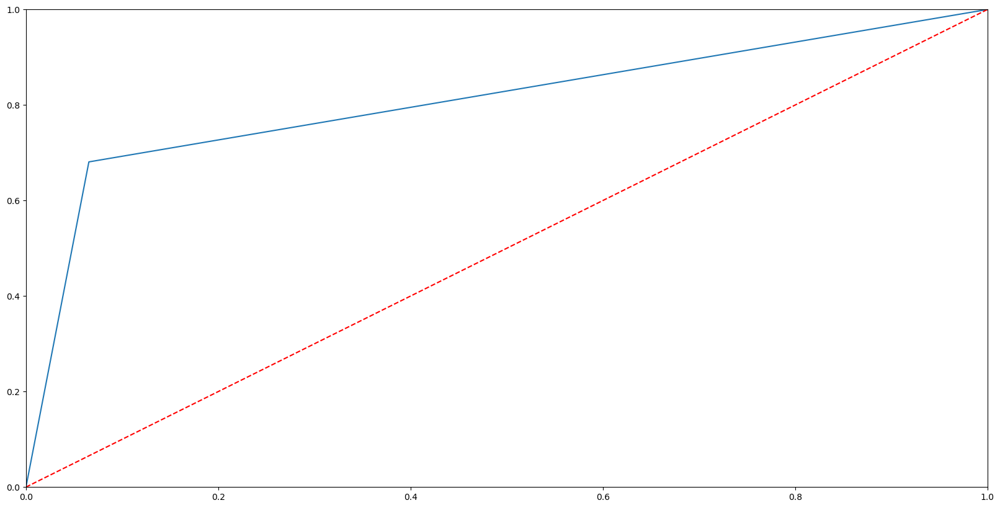

In [201]:
curve(ytest,xg_pred1)

### 5.Tunned Gradient Boosting Classifier:

In [202]:

param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],            # Step size shrinkage used to prevent overfitting
    'n_estimators': [50, 100, 150],                 # Number of boosting stages to be run
    'max_depth': [3, 5, 7]                         # Maximum depth of the individual trees
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model to find the best hyperparameters
grid_search.fit(xtrain_feat, ytrain)

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=100),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [203]:
# Get the best hyperparameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [204]:
best_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}

In [205]:
best_model

GradientBoostingClassifier(n_estimators=50, random_state=100)

In [206]:
gb1 = GradientBoostingClassifier(n_estimators=150,learning_rate = 0.01, max_depth = 3, random_state=100)
gb1.fit(xtrain_feat,ytrain)
gb_pred1 = gb1.predict(xtest_feat)
gb_pred1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [207]:
metrices('Tunned Gradient Boosting classifier',ytest,gb_pred1)

Name of the model : Tunned Gradient Boosting classifier
Precision score : 0.7805383022774327
Recall score : 0.643344709897611
Accuracy : 0.8730350665054414
F1-Score : 0.7053320860617399
Weighted F1-Score 0.8685980238684773
Classification report 
               precision    recall  f1-score   support

           0       0.90      0.94      0.92      1895
           1       0.78      0.64      0.71       586

    accuracy                           0.87      2481
   macro avg       0.84      0.79      0.81      2481
weighted avg       0.87      0.87      0.87      2481

Cohen Kappa Score : 0.6253726428050638


Area under the curve: 0.7937040172179348


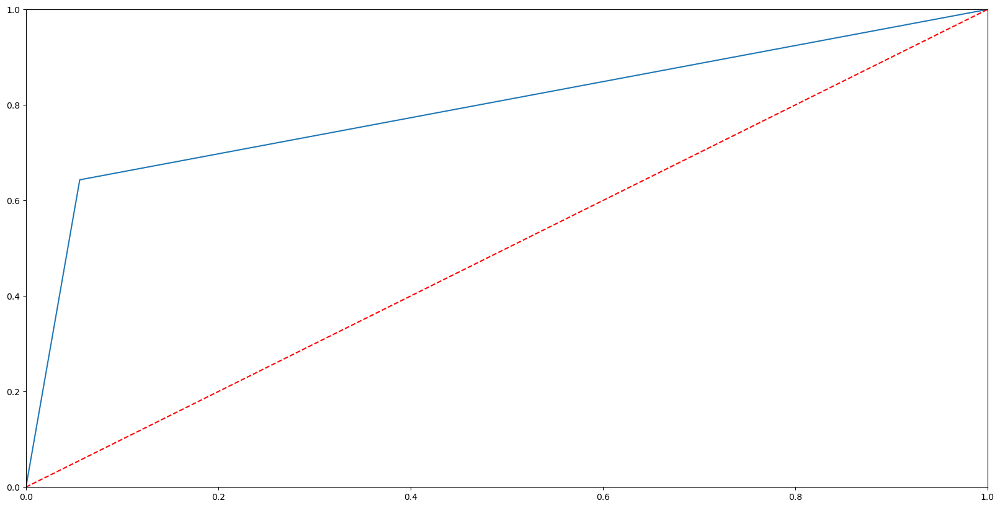

In [208]:
curve(ytest,gb_pred1)

In [209]:
a5 = round(accuracy_score(ytest,gb_pred1)*100,3)
a5

87.304

In [210]:
f5 = round(f1_score(ytest,gb_pred1,average='weighted')*100,3)
f5

86.86

# Summary

In [211]:
data = {'Models':['Gradient Boosting Classifier','Support Vector Machine(classifier)','Tunned Random Forest Classifier',
                  'Tunned XG Boosting Classifier','Tunned Gradient Boosting Classifier'],       
        'Accuracy':[a1,a2,a3,a4,a5],
         'Weighted F1_score':[f1,f2,f3,f4,f5]}

In [212]:
result = pd.DataFrame(data).sort_values(by = ['Accuracy','Weighted F1_score'],ascending=False)

In [213]:
result

,Models,Accuracy,Weighted F1_score
0,Gradient Boosting Classifier,88.110,87.934
3,Tunned XG Boosting Classifier,87.465,87.211
1,Support Vector Machine(classifier),87.344,87.243
4,Tunned Gradient Boosting Classifier,87.304,86.860
2,Tunned Random Forest Classifier,86.900,86.542


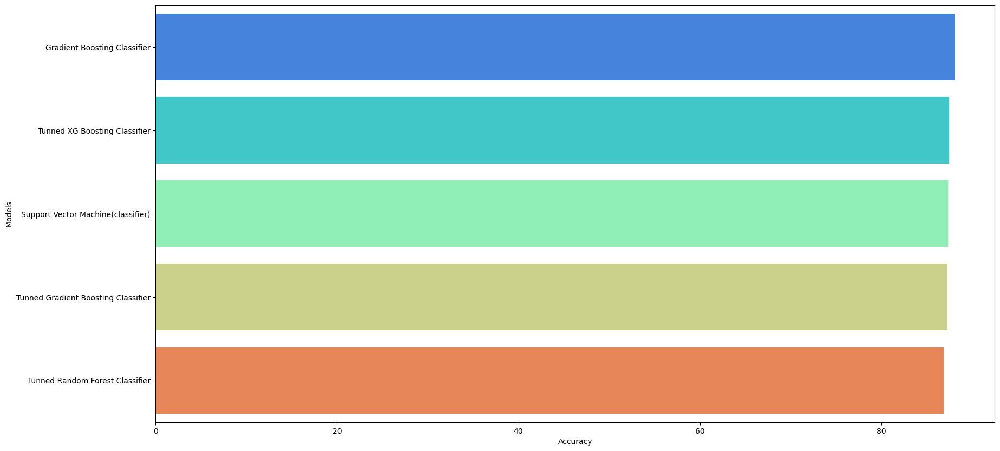

In [214]:
sns.barplot(x=result['Accuracy'],y=result['Models'],palette='rainbow')
plt.show()

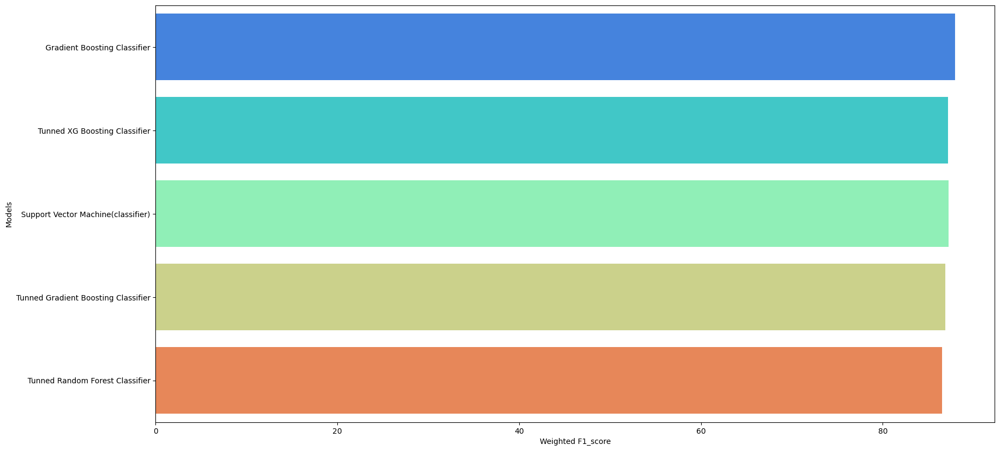

In [215]:
sns.barplot(x=result['Weighted F1_score'],y=result['Models'],palette='rainbow')
plt.show()

Based on the analysis of the balanced data set using the Gradient Boosting model, the following conclusions can be drawn:


1. **High Accuracy**: The Gradient Boosting model achieved a high accuracy of 87.46%. This means that the model is making correct predictions for approximately 87.46% of the instances in the dataset. This high accuracy indicates that the model is performing well in classifying the data into the correct classes.

2. **Balanced F1 Score(weighted)**: The weighted F1 score of 87% suggests that the model is reasonably good at maintaining a balance between precision and recall. The weighted F1 score takes into account class imbalances, and a value of 78% implies that the model is effectively identifying both positive and negative instances.